# Extract velocity time series from all velocity maps in a folder

In [1]:
import numpy as np
import pandas as pd
import os
import glob
import shutil

import matplotlib.pyplot as plt
from matplotlib import patches
import matplotlib.dates as mdates
import datetime

import numpy.ma as ma
import seaborn as sns
import fiona
import rasterio as rio
from rasterio.mask import mask
from shapely.geometry import mapping
import geopandas as gpd

from rasterstats import zonal_stats
from sklearn.metrics import mean_squared_error

In [7]:
# path to autorift velocity maps
# autorift_outp = '/Users/jukesliu/Documents/TURNER/DATA/VELOCITY_MAPS/output_AutoRIFT/'
autorift_outp = '/Volumes/SURGE_DISK/PS_downloads_SK/output_dt5to60/'
print(os.listdir(autorift_outp))

# path to folder that will hold the centerline velocity files
# cline_outpath = '/Users/jukesliu/Documents/TURNER/DATA/VELOCITY_MAPS/custom_autoRIFT_cline_data/'
cline_outpath = '/Volumes/SURGE_DISK/PS_downloads_SK/centerline_velocities/'

# path to folder with the stable surface mask
# refvpath = '/Users/jukesliu/Documents/TURNER/DATA/VELOCITY_MAPS/forAutoRIFT/'
# refvpath = '/Volumes/LaCie/VG/'

# read in glacier shapefile and grab outline as shapes
with fiona.open('/Users/jukesliu/Documents/TURNER/DATA/shapefiles_gis/Turner_RGI/TG_glims_polygon_UTM7.shp') as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

['offset_20200819_20200904_100m_PS.mat', 'offset_20200515_20200527_200m_PS.tif', 'velocity_20211010_20211016_100m_PS.tif', 'offset_20201105_20201110_200m_PS.tif', 'velocity_20210602_20210608_200m_PS.tif', 'offset_20211004_20211010_100m_PS.tif', 'offset_20210212_20210223_200m_PS.mat', 'parameters_20210223_20210303_200m_PS.txt', 'velocity_20200904_20200911_200m_PS.tif', 'offset_20210126_20210131_200m_PS.tif', 'velocity_20211016_20211021_200m_PS.tif', 'velocity_20210402_20210407_100m_PS.tif', 'parameters_20210831_20210907_100m_PS.txt', 'parameters_20200805_20200819_200m_PS.txt', 'parameters_20201022_20201105_200m_PS.txt', 'velocity_20210131_20210207_200m_PS.tif', 'offset_20210608_20210619_200m_PS.tif', 'offset_20210421_20210426_100m_PS.mat', 'parameters_20210630_20210705_200m_PS.txt', 'offset_20201105_20201110_200m_PS.mat', 'parameters_20210207_20210212_200m_PS.txt', 'offset_20200819_20200904_100m_PS.tif', 'offset_20200515_20200527_200m_PS.mat', 'window_offset.tif', 'offset_20211004_20211

# 1) Extract velocities along centerline using a centerline shapefile

In [14]:
######################################################################
# Enter in path to the glacier centerlines
clinepath = '/Users/jukesliu/Documents/TURNER/DATA/shapefiles_gis/centerline_n_final_utm07_250m.shp'
# clinepath = '/Users/jukesliu/Documents/TURNER/DATA/shapefiles_gis/VG/VG_cline_250m.shp'
n_or_s = clinepath.split('/')[-1].split('_')[1]
cline = fiona.open(clinepath)

# specify a start and end date
startdate = datetime.datetime.strptime('19910601', '%Y%m%d');
enddate = datetime.datetime.strptime('20240101', '%Y%m%d'); 
print('Extracting maps from', startdate, 'to', enddate)
######################################################################

Extracting maps from 1991-06-01 00:00:00 to 2024-01-01 00:00:00


Extracting centerline data.


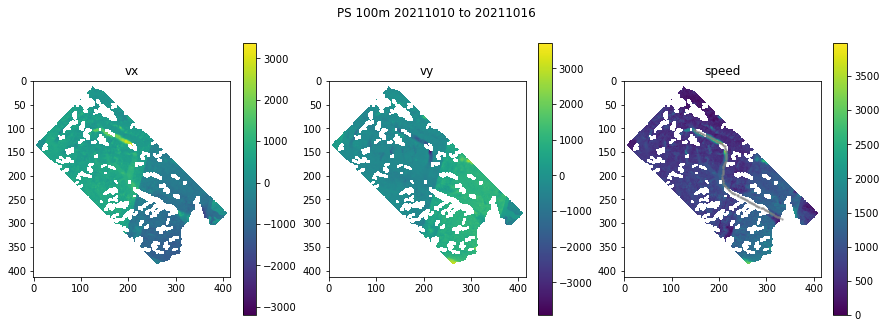

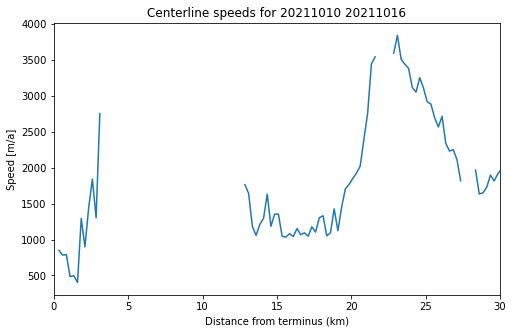

Extracting centerline data.


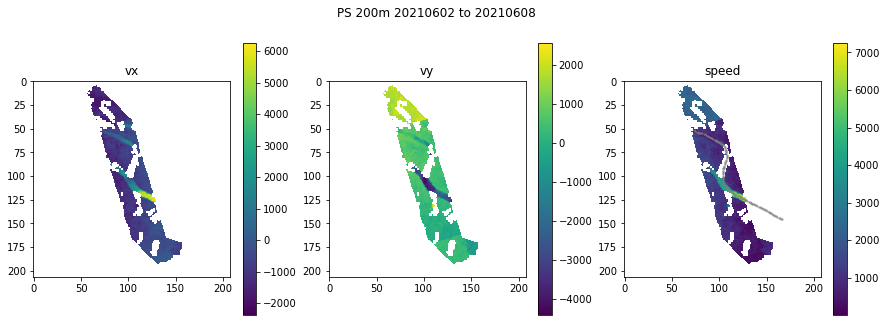

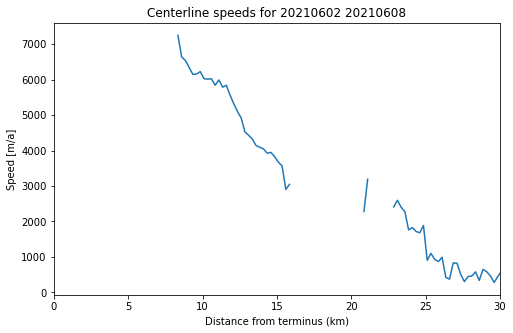

Extracting centerline data.


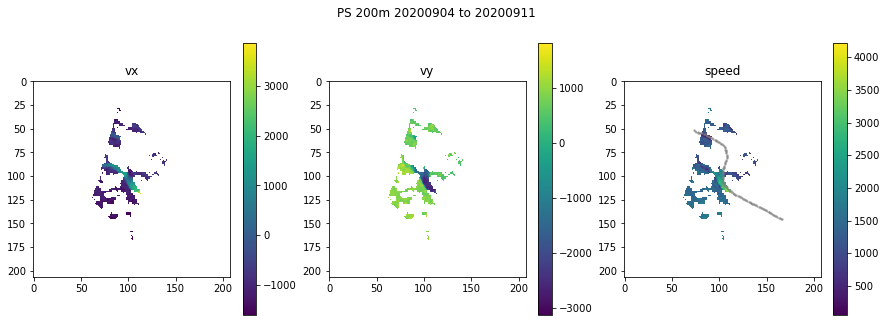

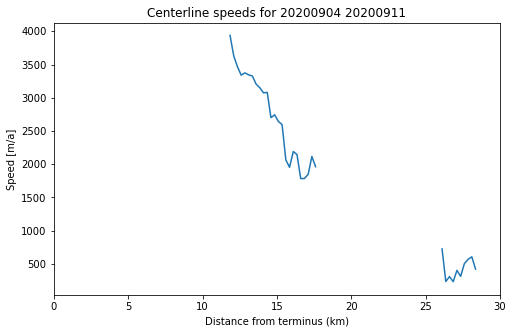

Extracting centerline data.


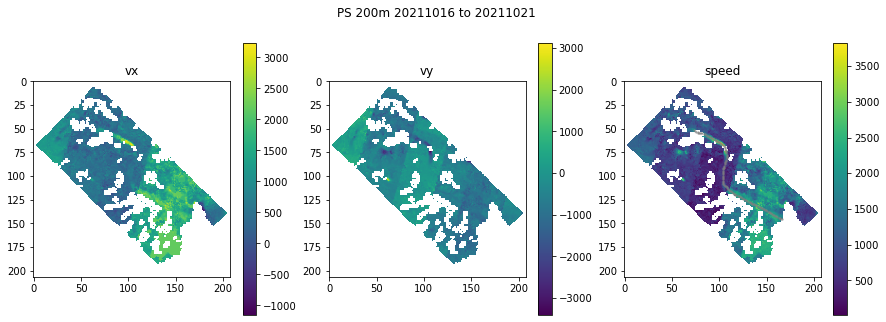

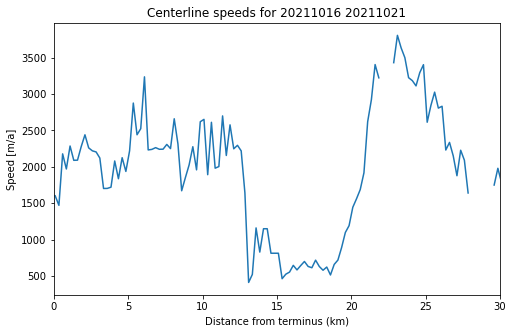

Extracting centerline data.


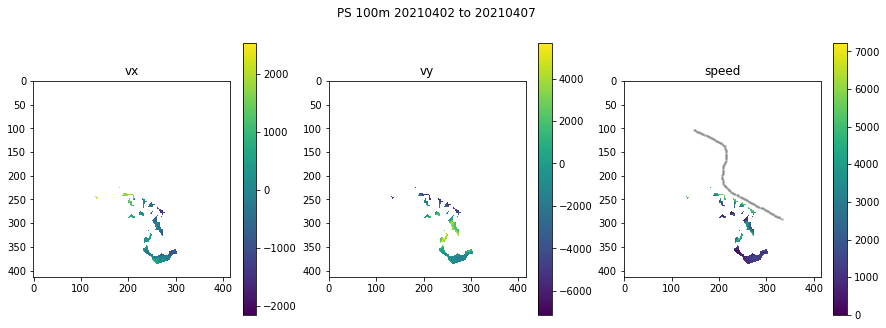

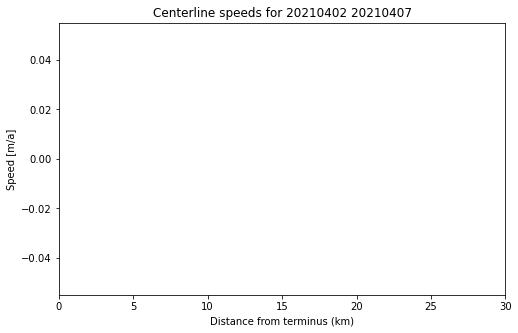

Extracting centerline data.


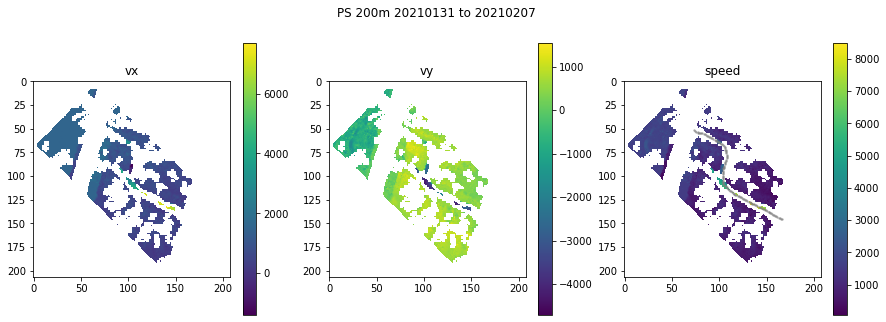

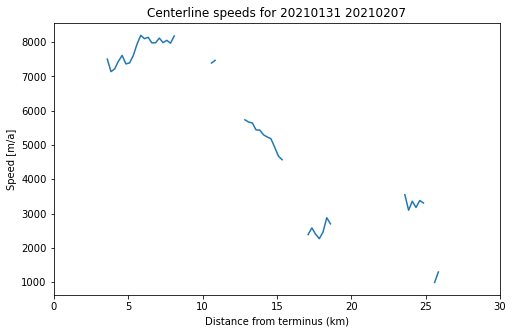

Extracting centerline data.


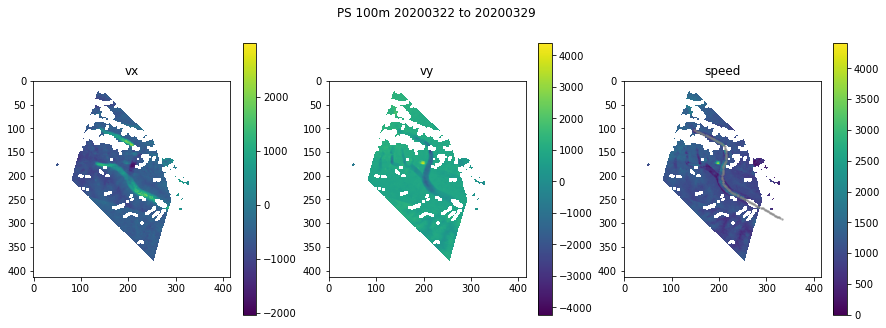

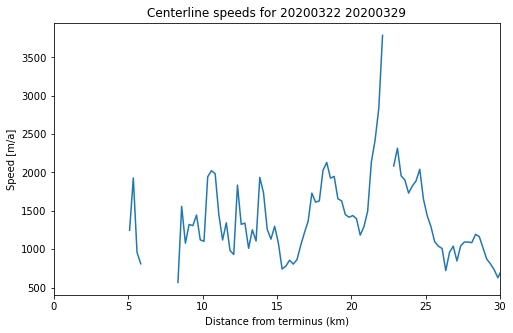

Extracting centerline data.


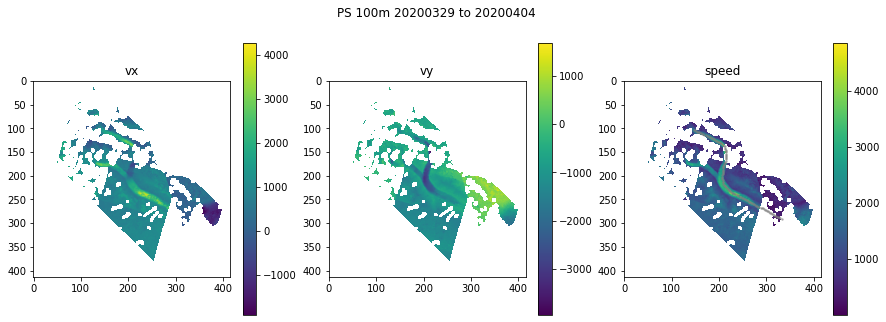

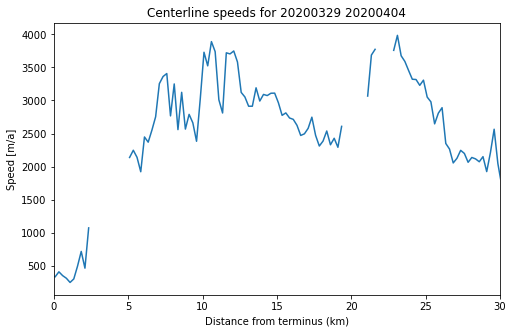

Extracting centerline data.


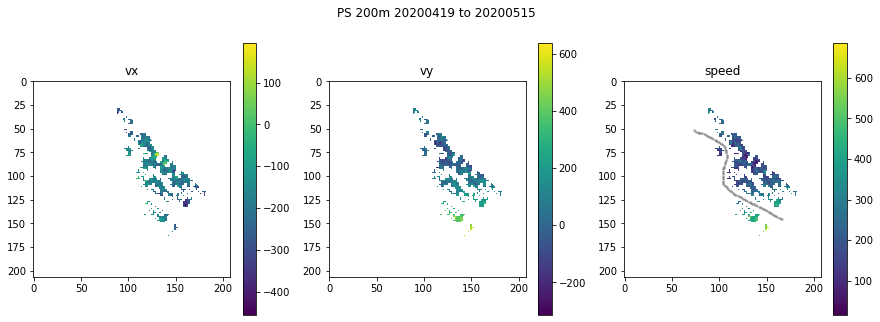

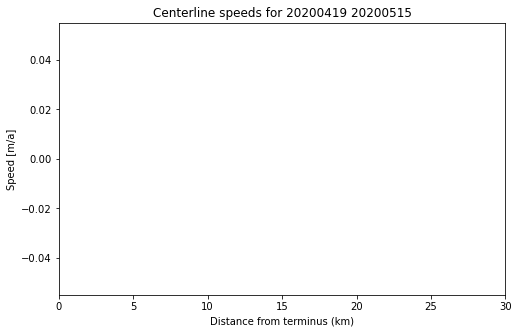

Extracting centerline data.


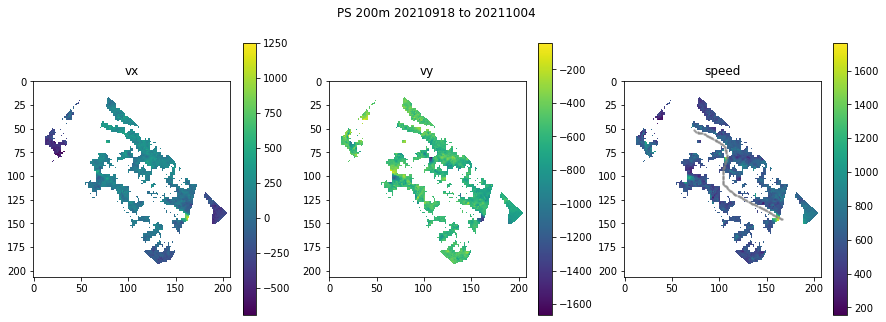

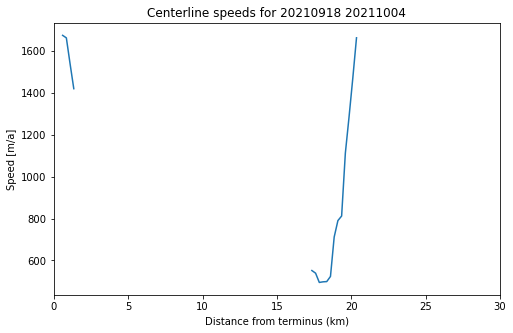

Extracting centerline data.


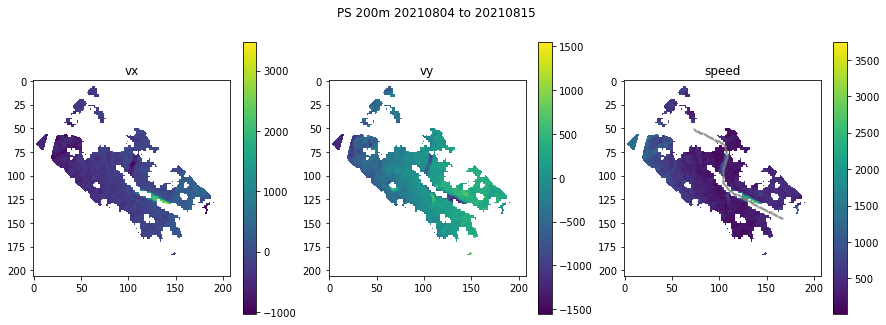

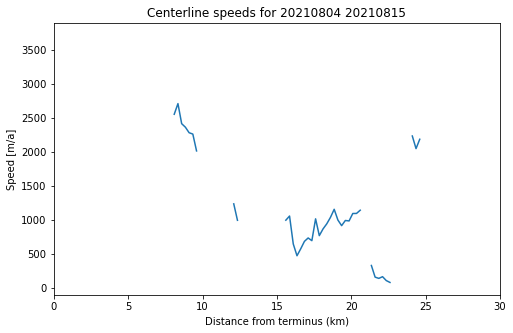

Extracting centerline data.


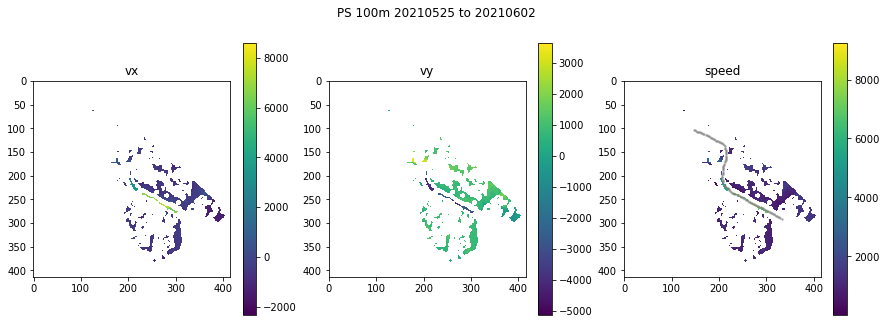

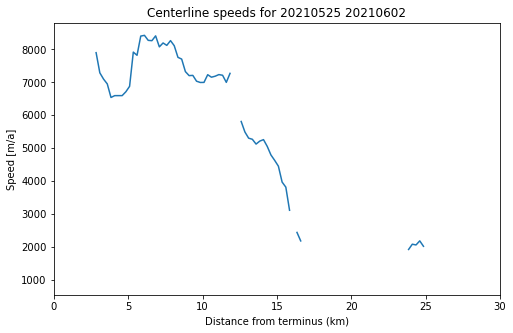

Extracting centerline data.


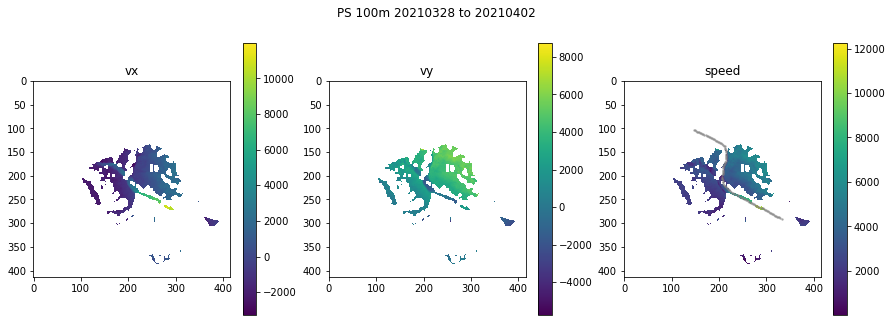

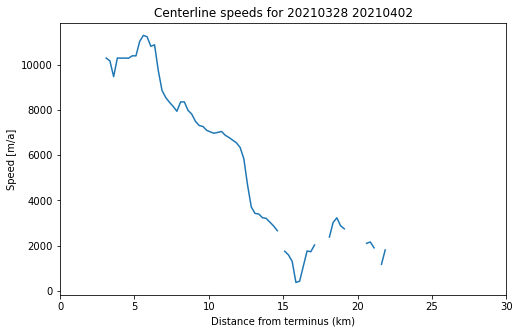

Extracting centerline data.


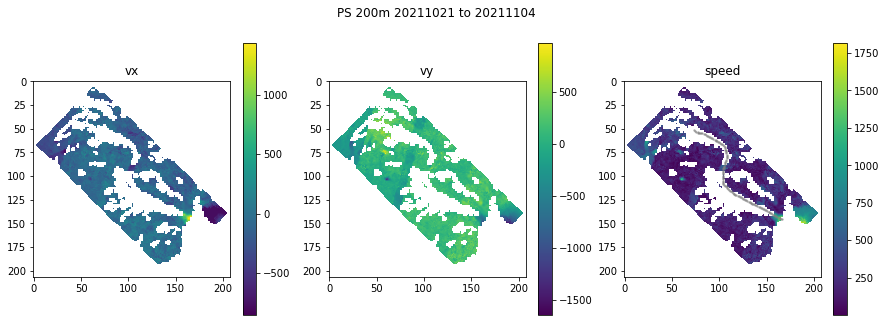

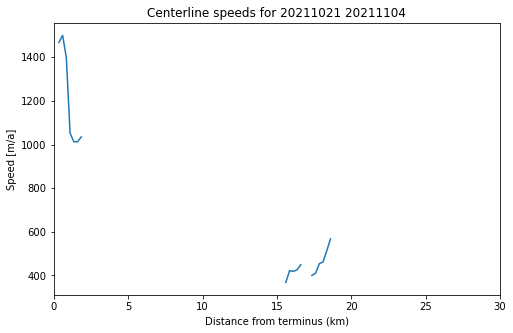

Extracting centerline data.


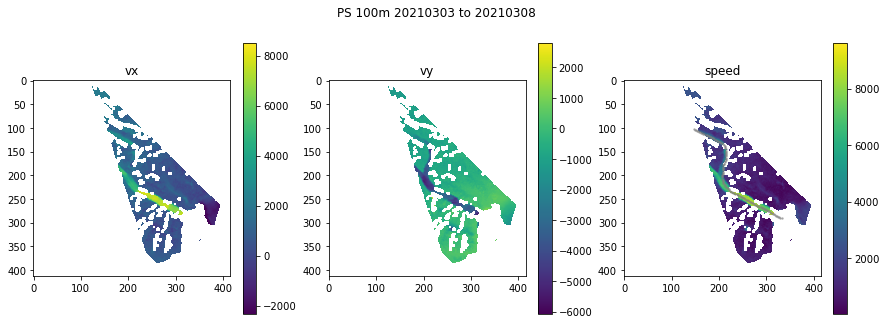

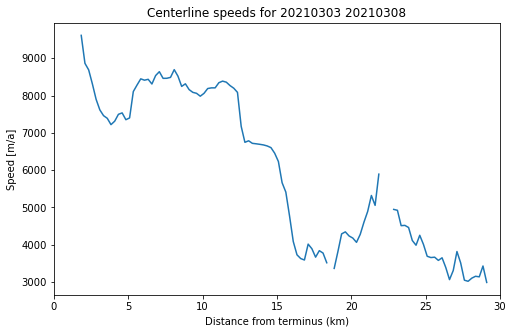

Extracting centerline data.


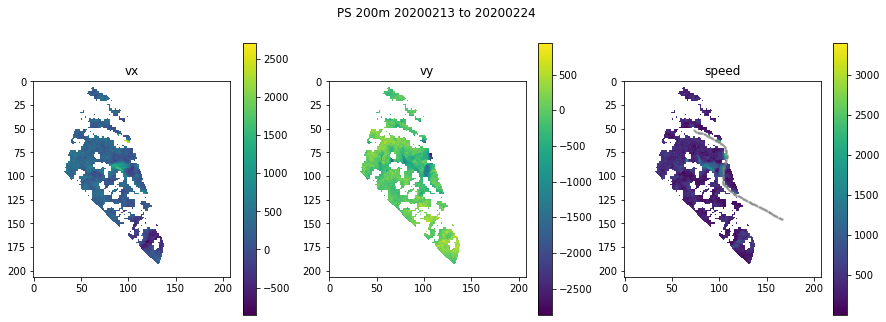

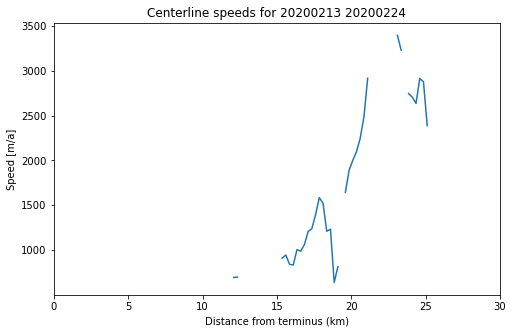

Extracting centerline data.


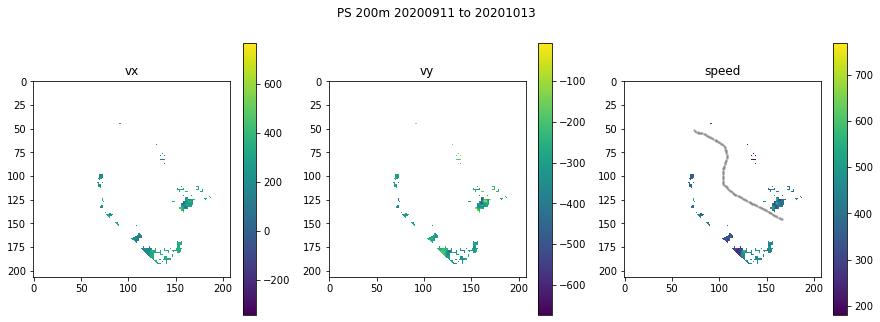

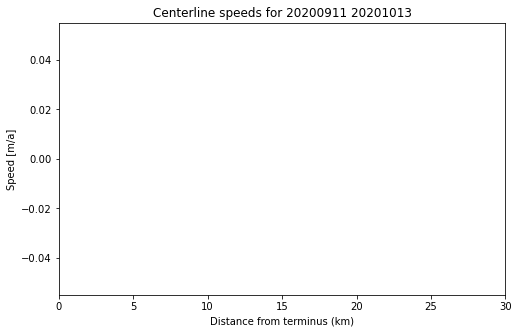

Extracting centerline data.


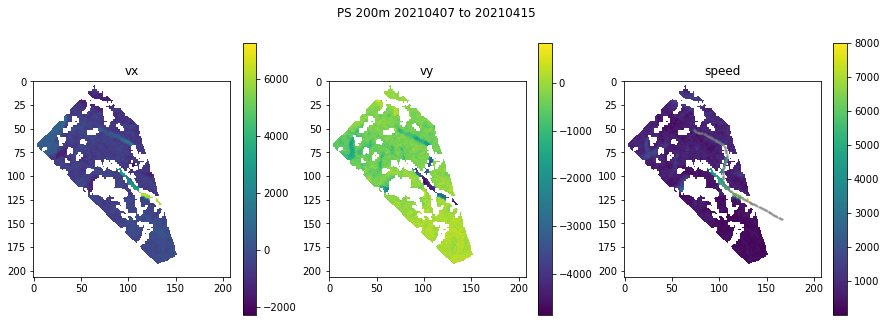

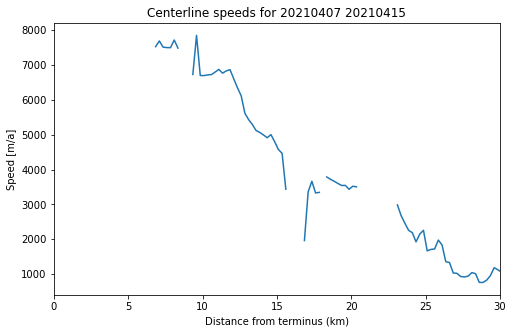

Extracting centerline data.


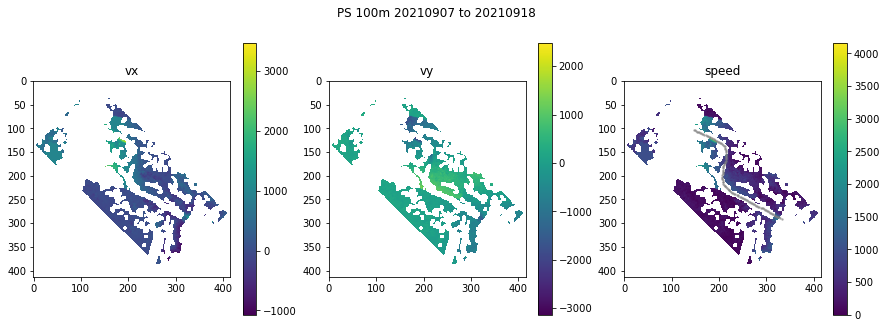

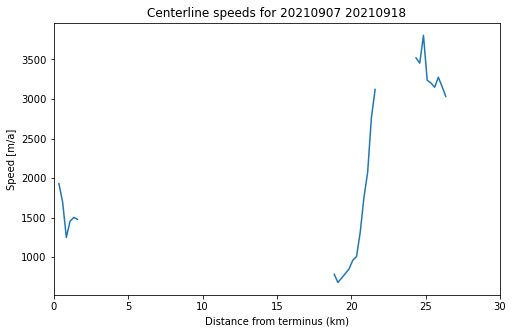

Extracting centerline data.


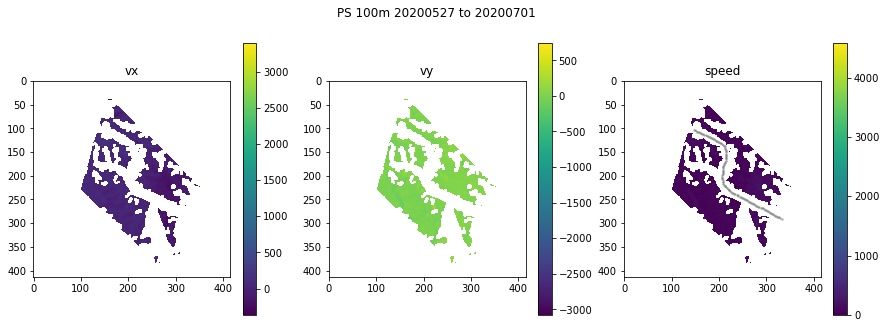

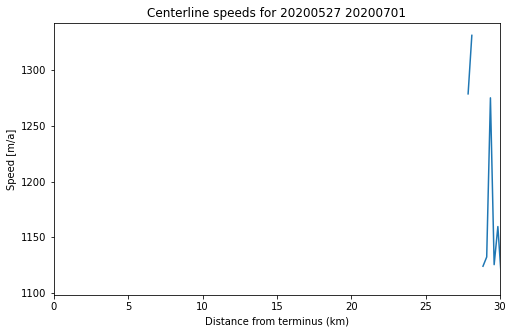

Extracting centerline data.


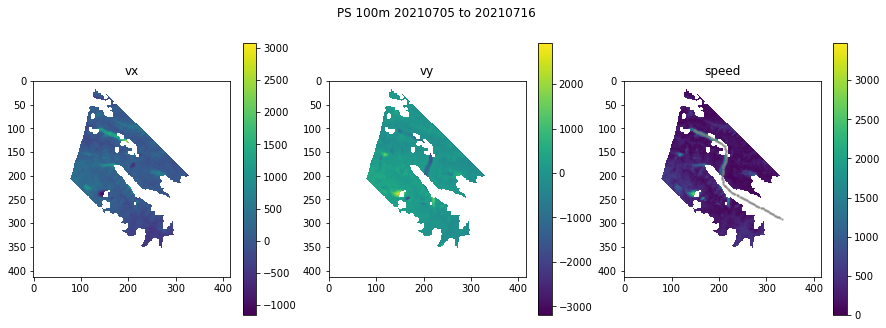

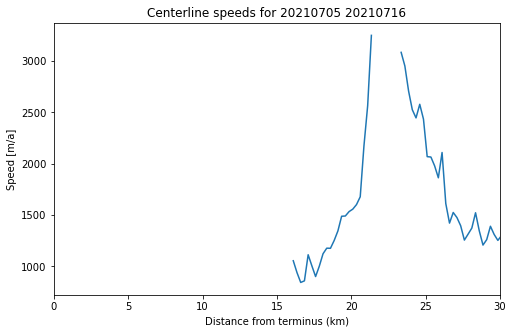

Extracting centerline data.


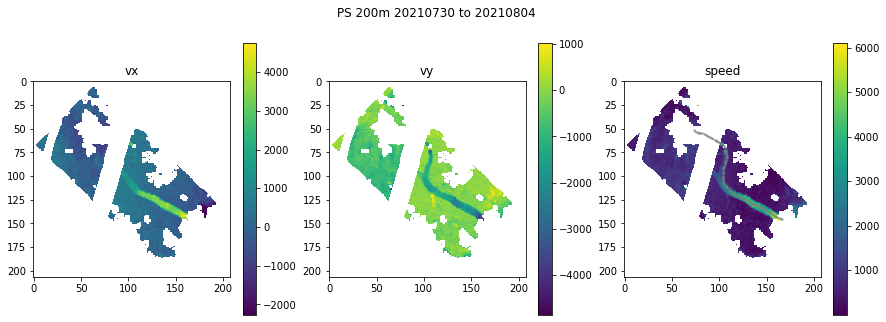

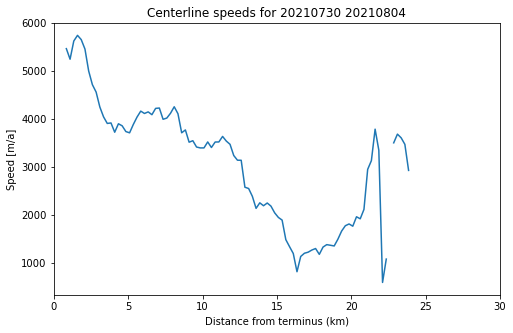

Extracting centerline data.


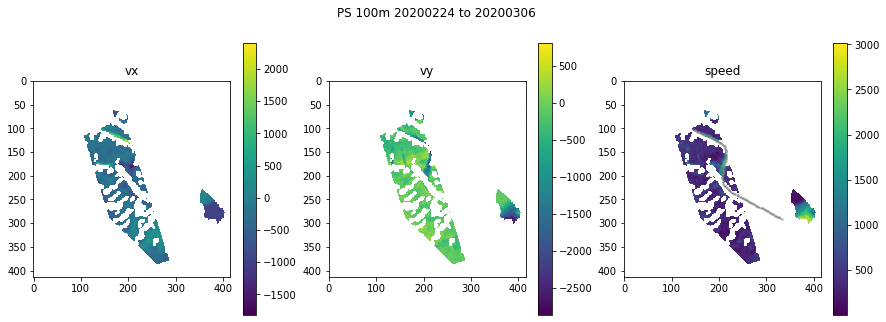

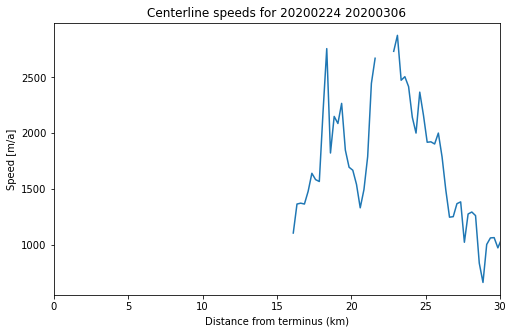

Extracting centerline data.


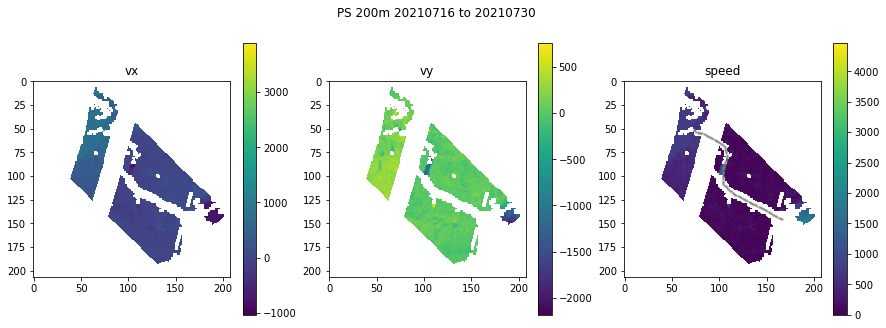

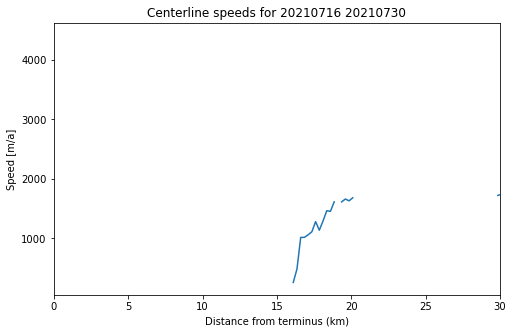

Extracting centerline data.


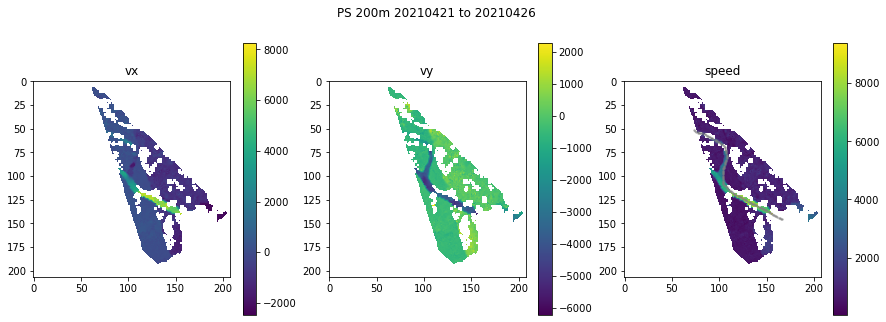

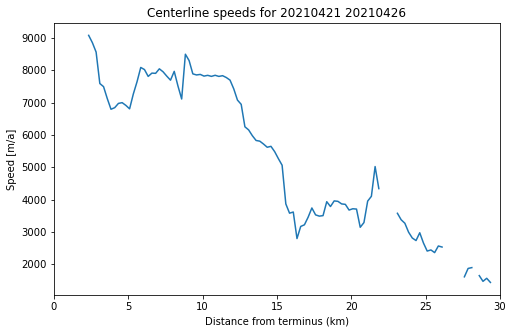

Extracting centerline data.


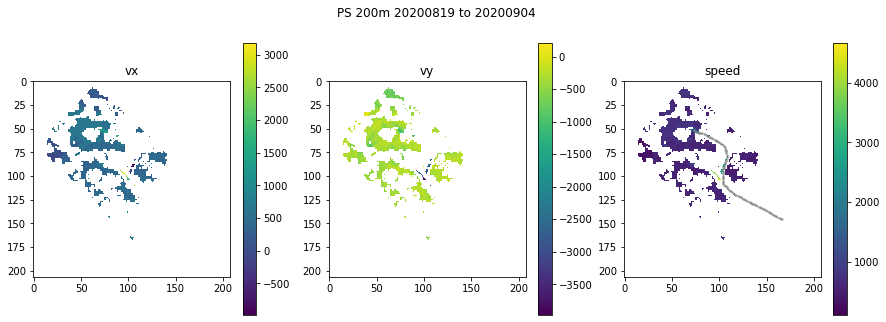

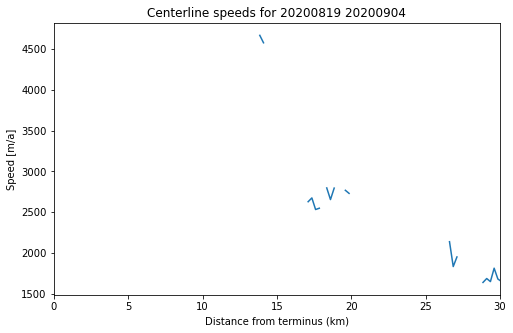

Extracting centerline data.


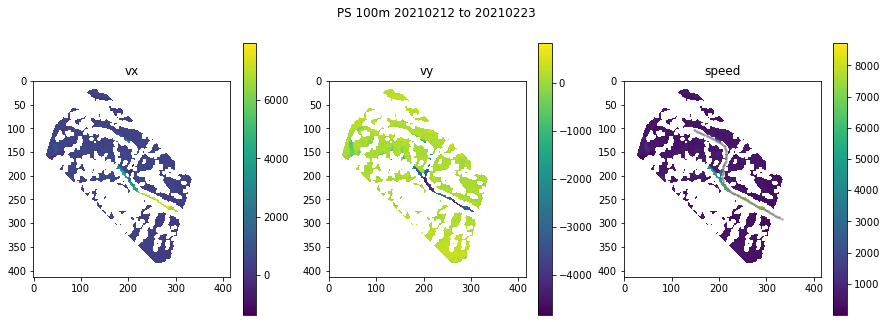

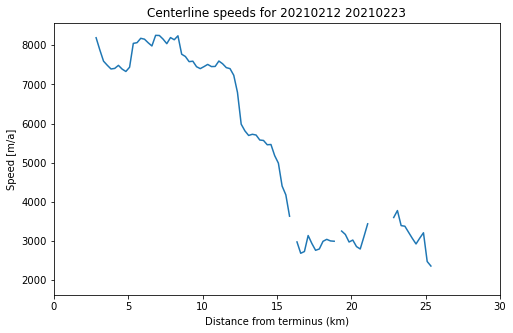

Extracting centerline data.


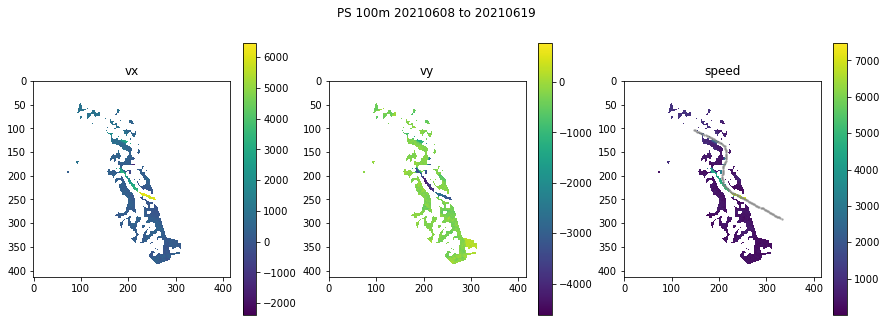

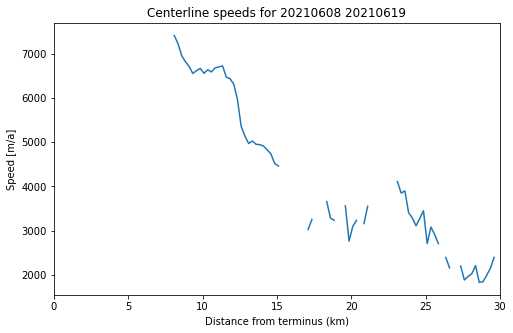

Extracting centerline data.


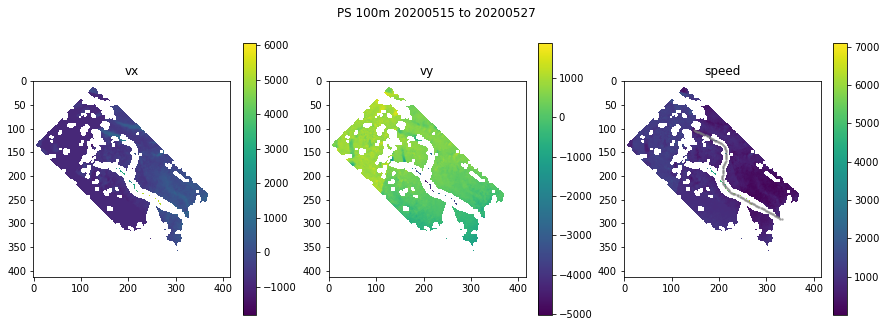

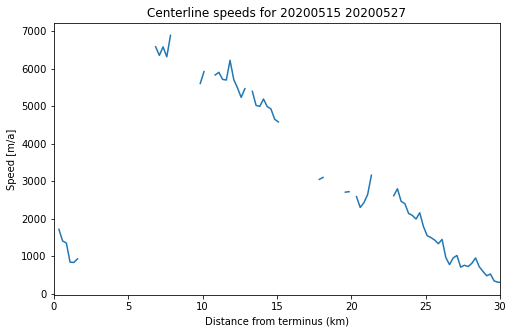

Extracting centerline data.


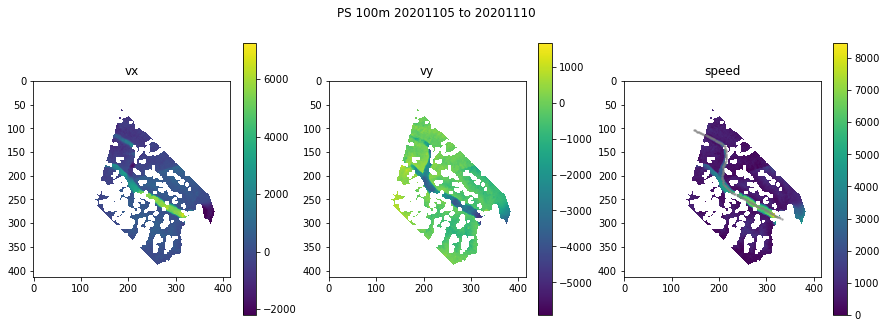

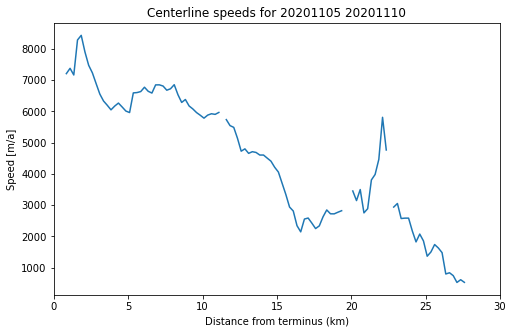

Extracting centerline data.


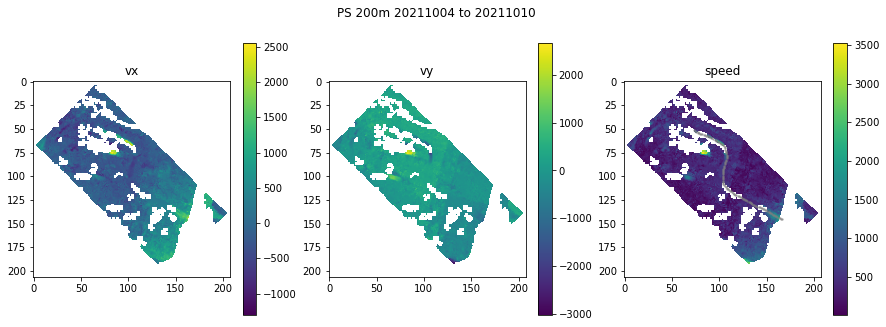

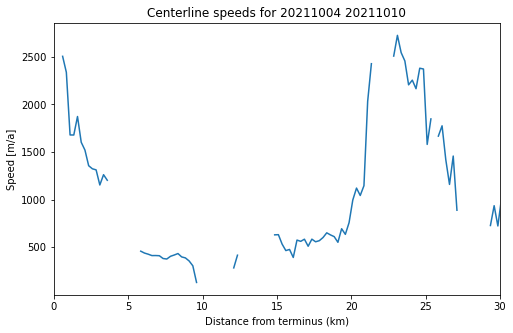

Extracting centerline data.


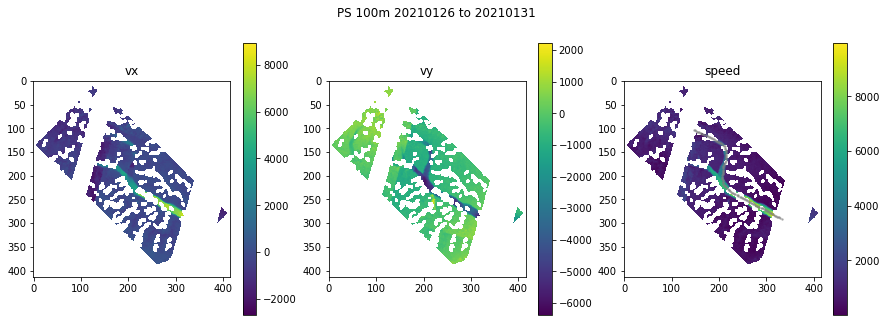

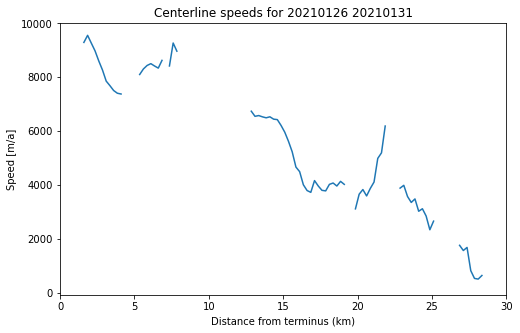

Extracting centerline data.


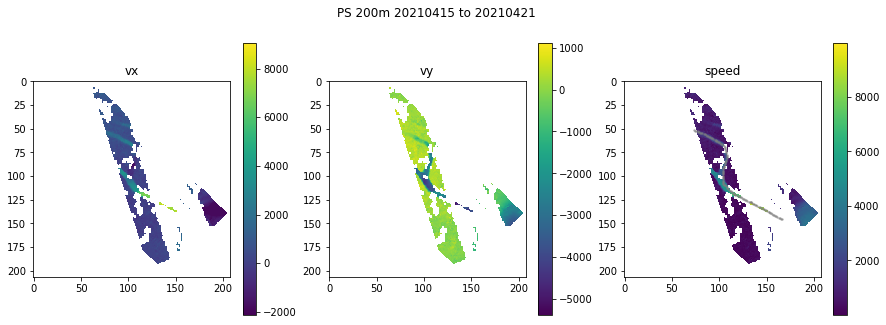

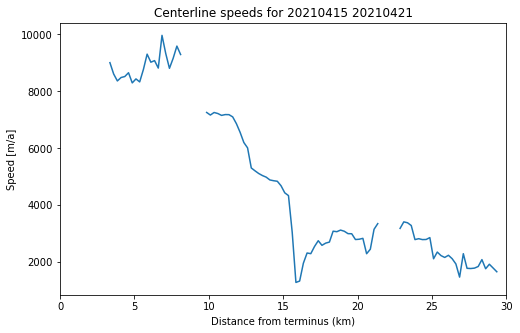

Extracting centerline data.


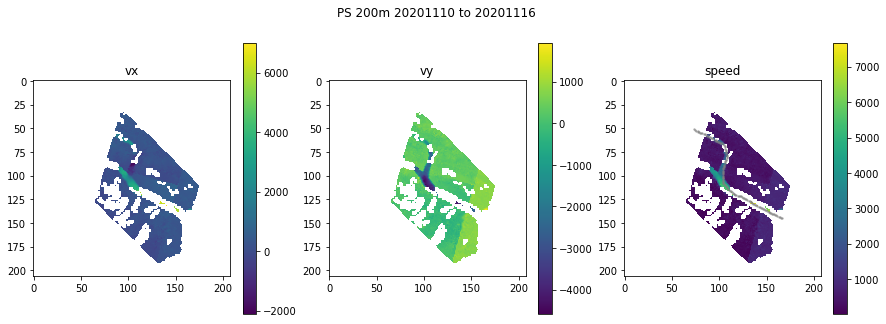

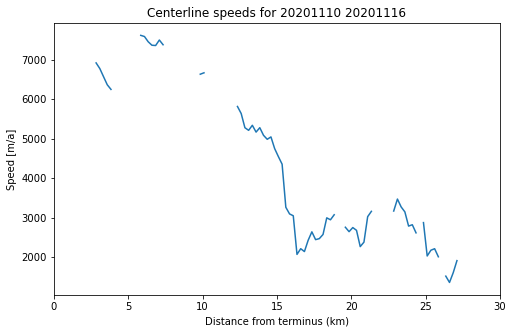

Extracting centerline data.


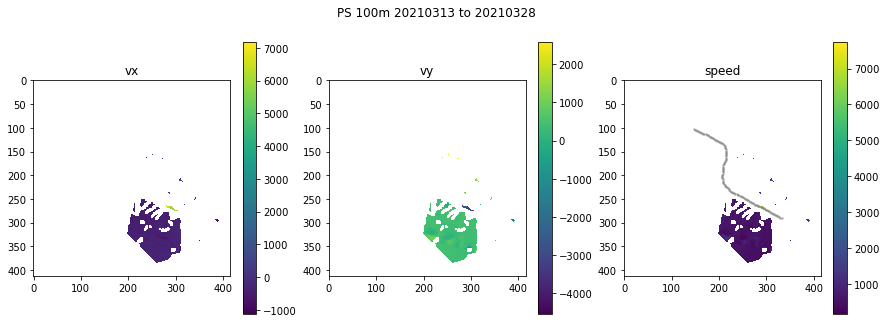

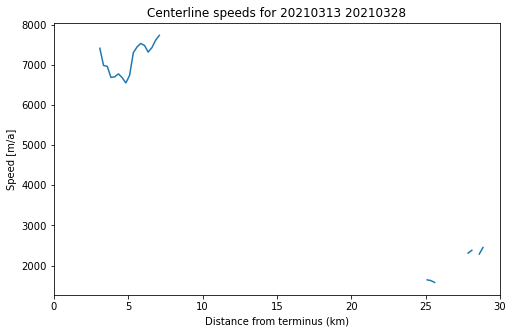

Extracting centerline data.


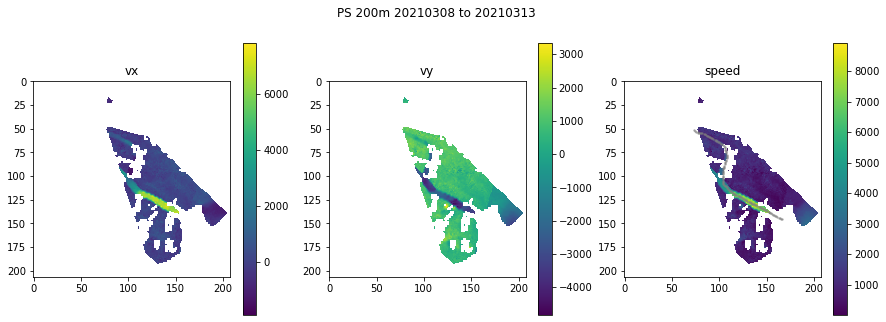

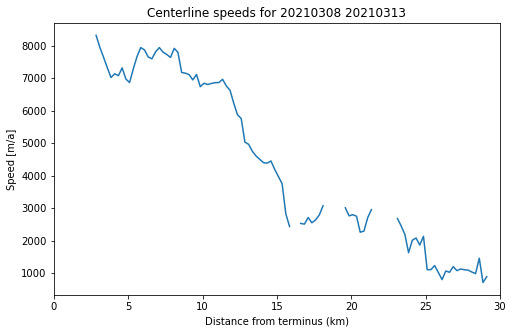

Extracting centerline data.


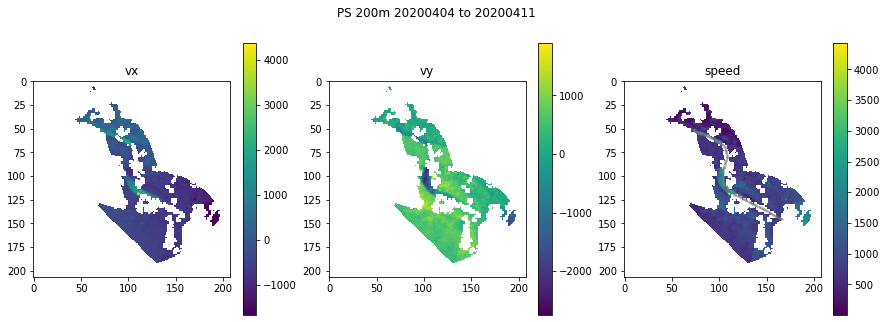

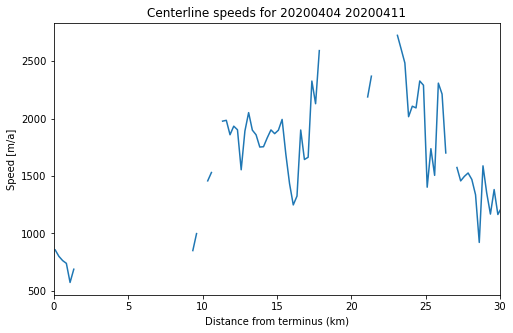

Extracting centerline data.


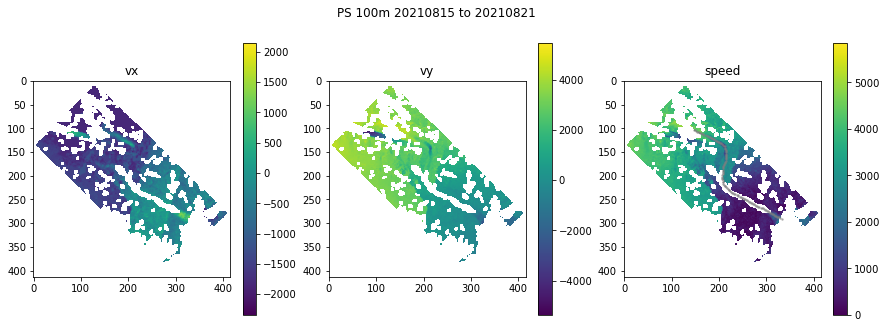

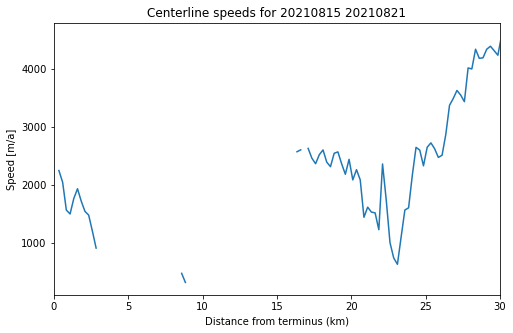

Extracting centerline data.


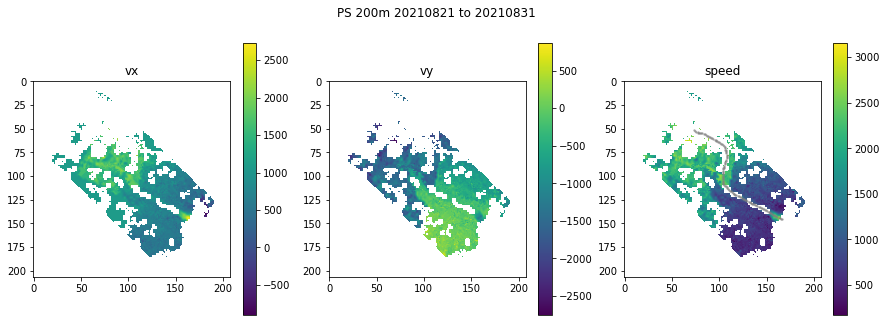

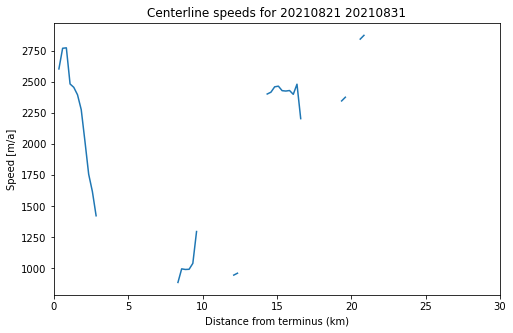

Extracting centerline data.


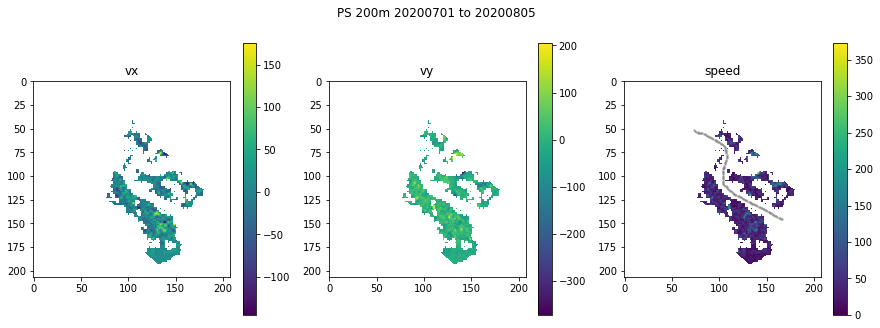

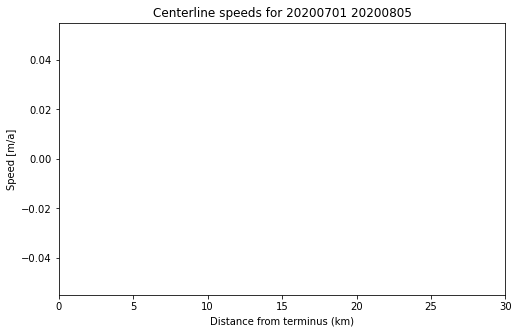

Extracting centerline data.


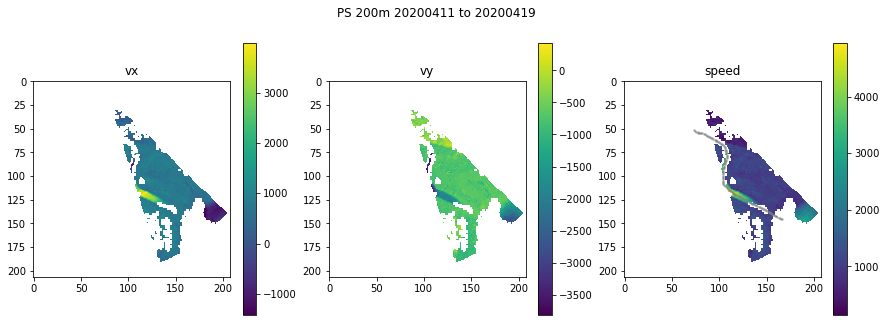

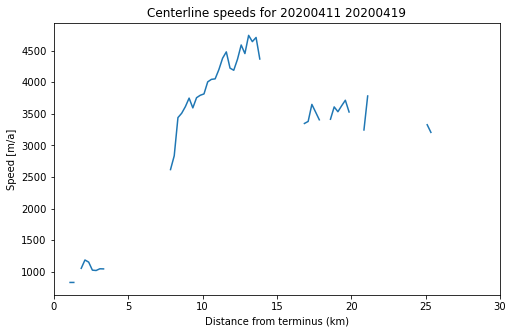

Extracting centerline data.


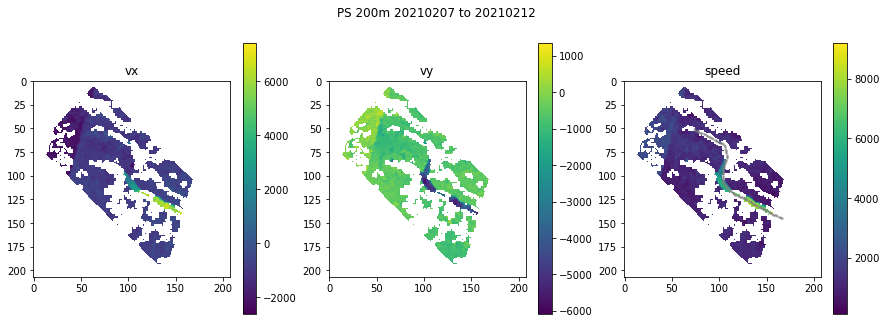

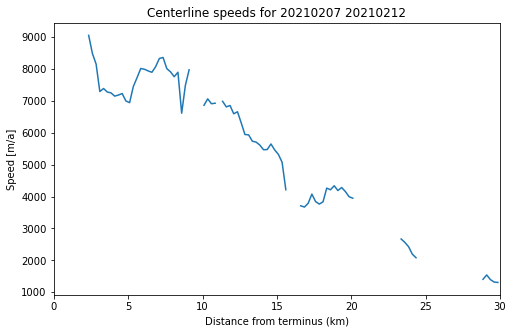

Extracting centerline data.


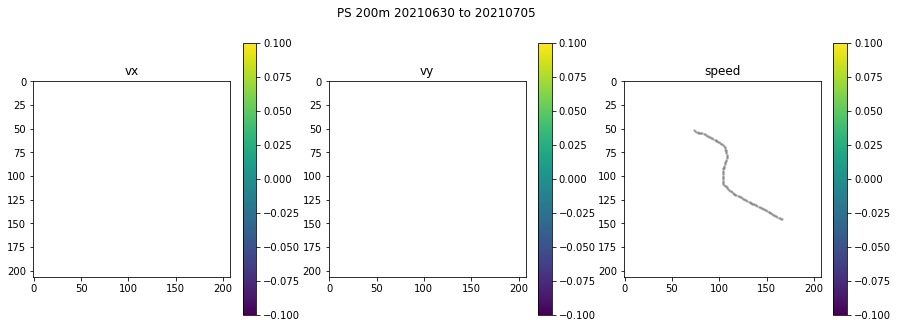

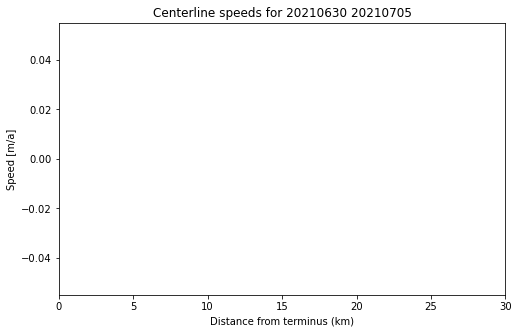

Extracting centerline data.


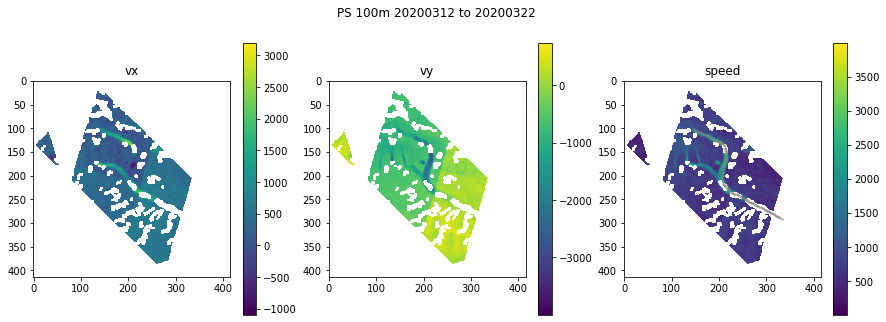

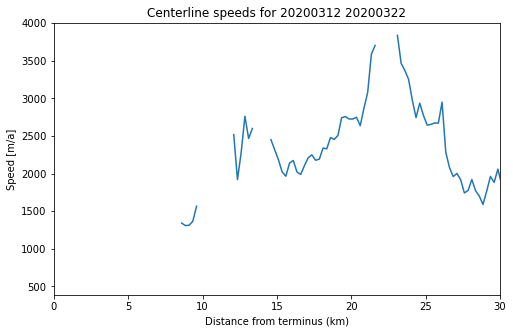

Extracting centerline data.


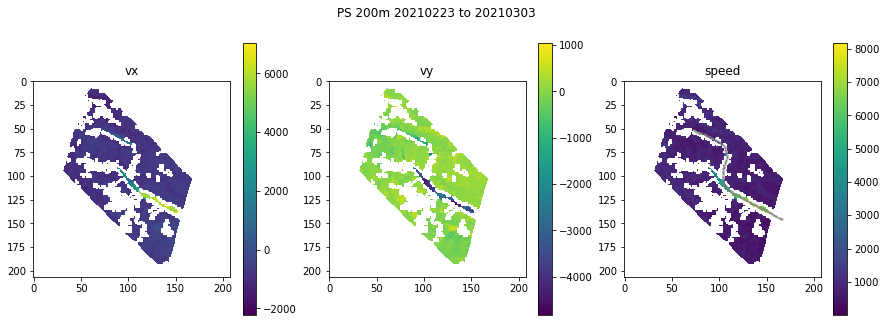

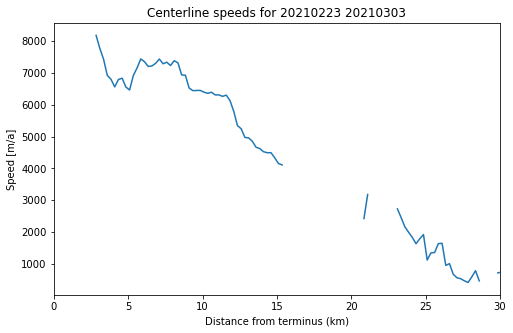

Extracting centerline data.


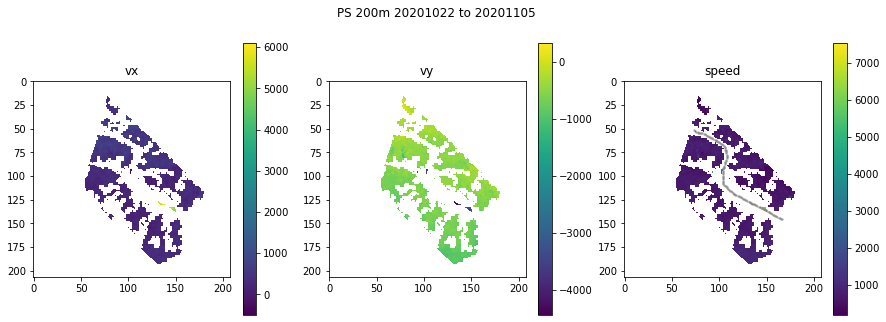

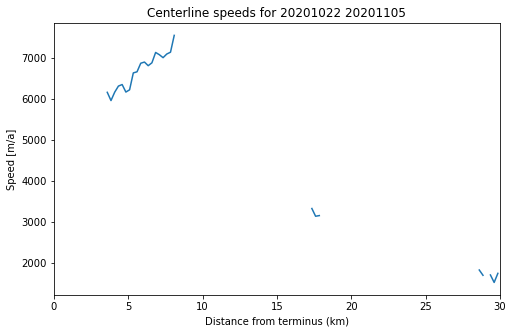

Extracting centerline data.


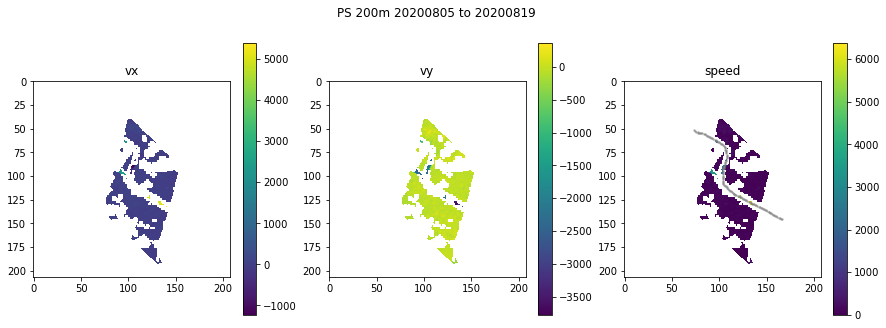

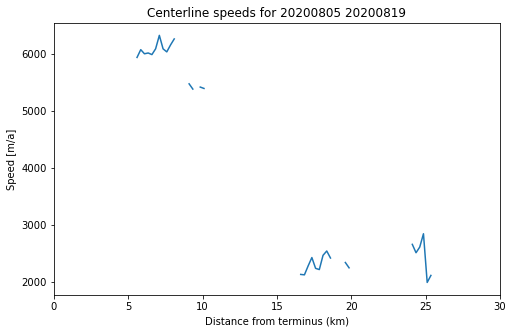

Extracting centerline data.


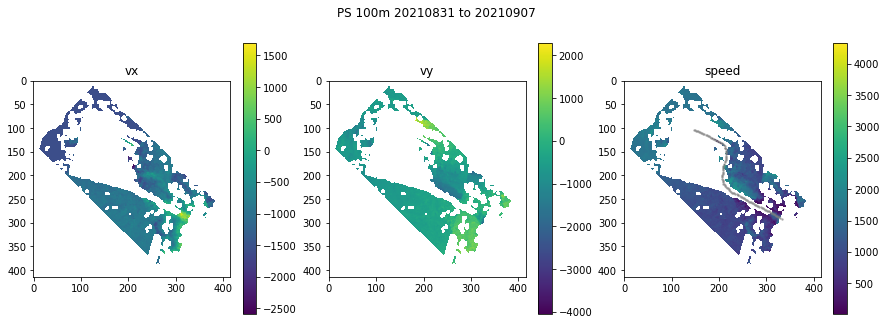

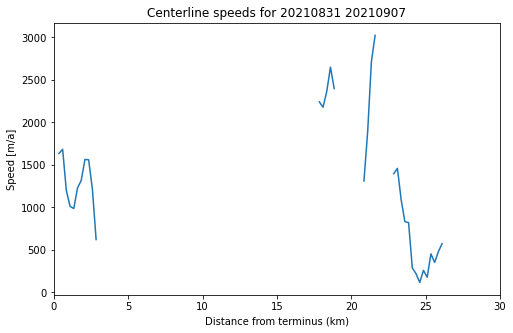

Extracting centerline data.


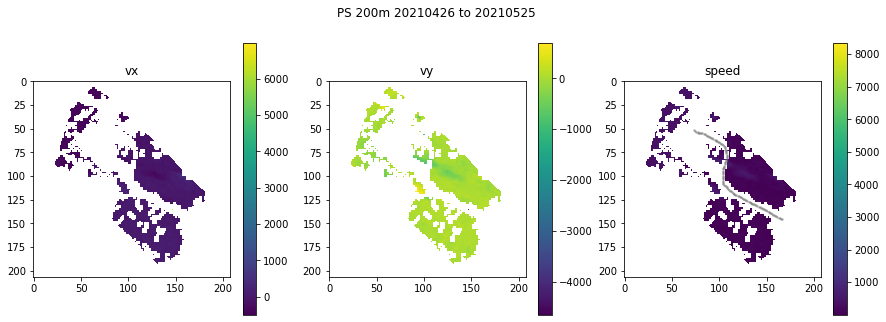

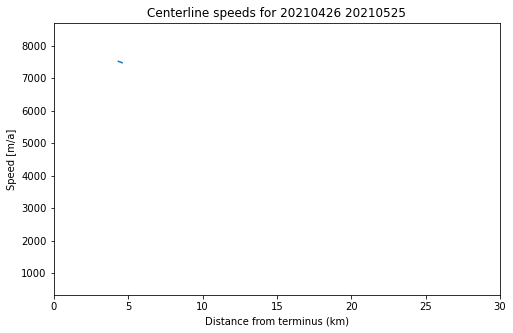

Extracting centerline data.


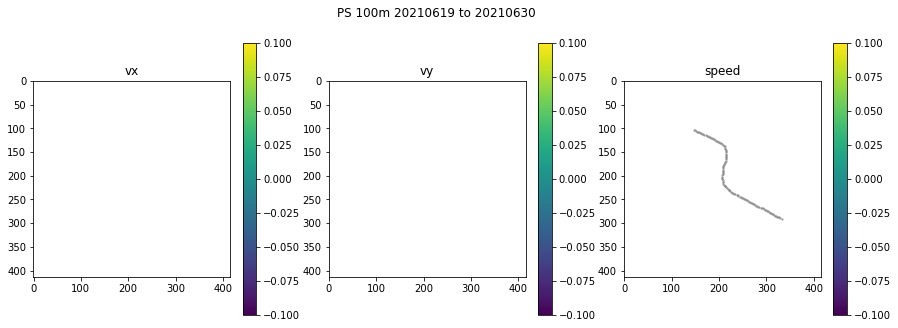

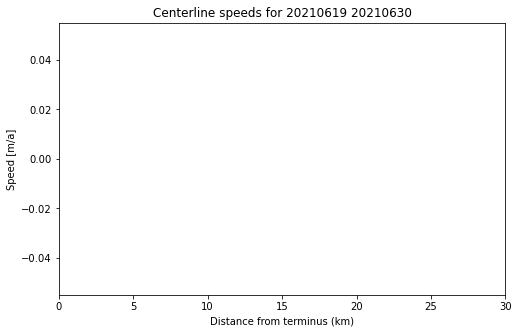

Extracting centerline data.


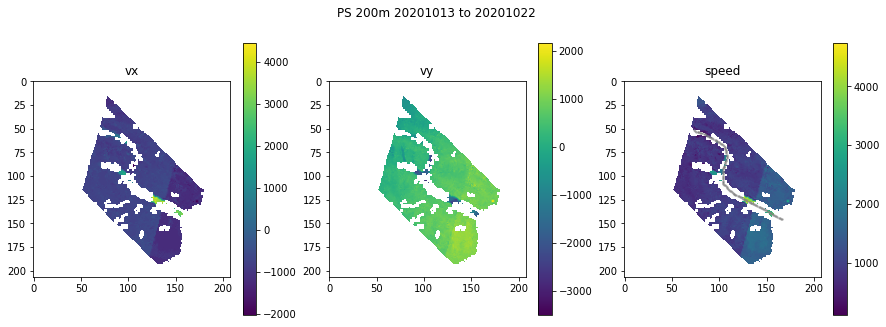

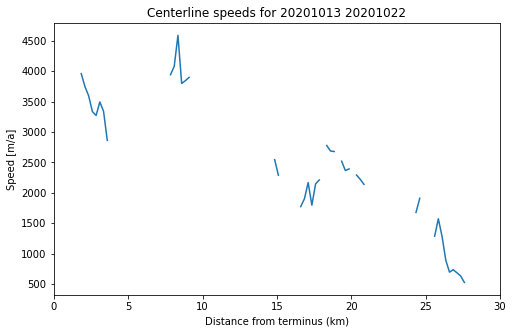

Extracting centerline data.


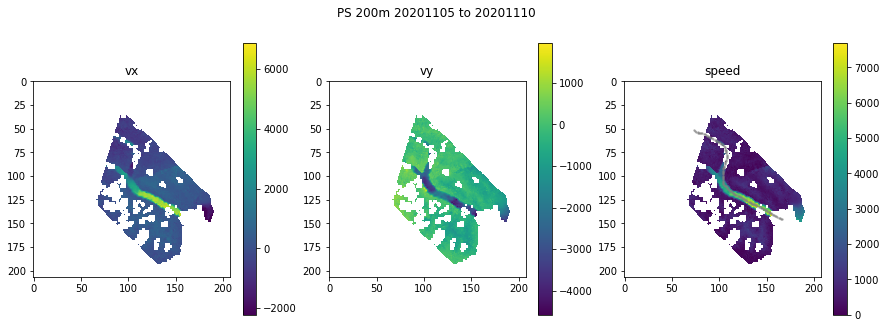

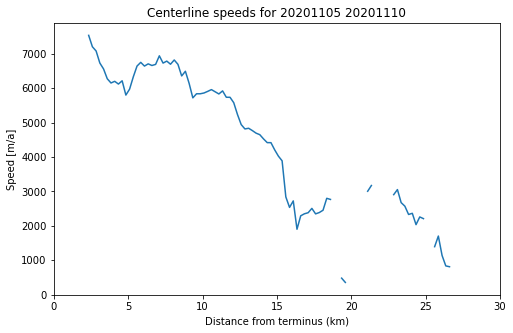

Extracting centerline data.


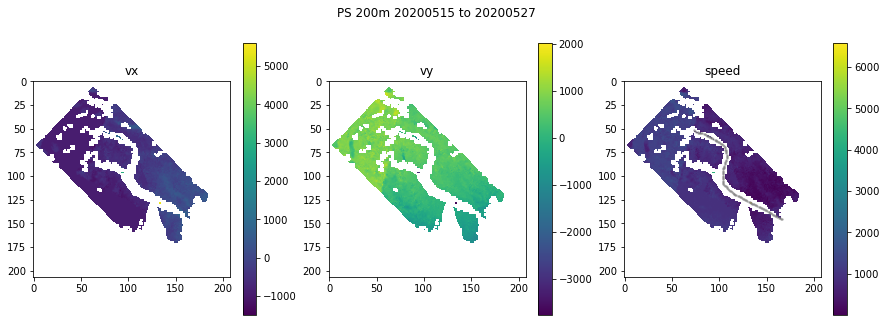

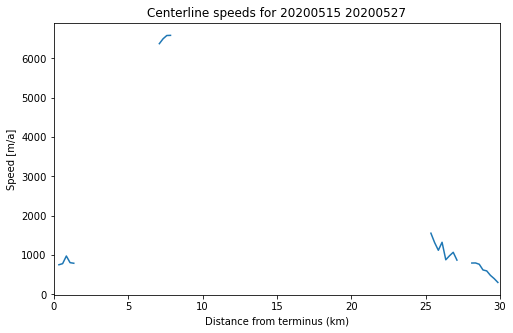

Extracting centerline data.


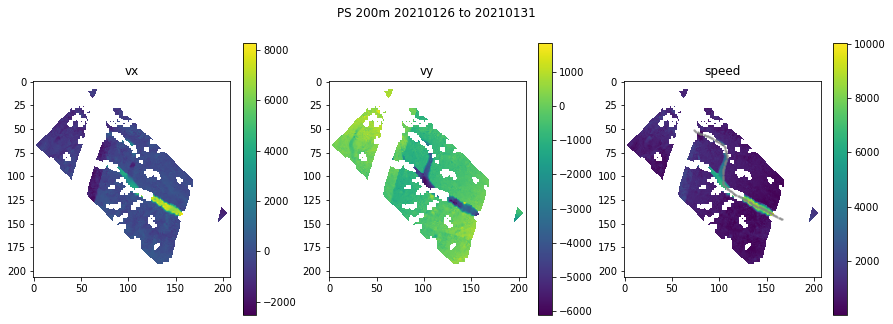

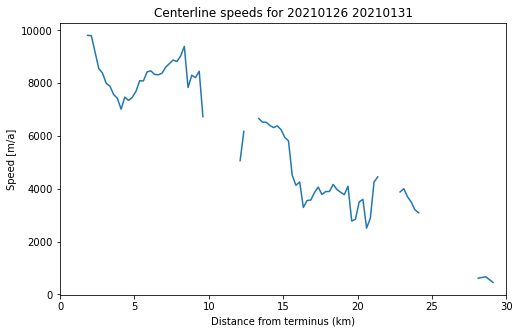

Extracting centerline data.


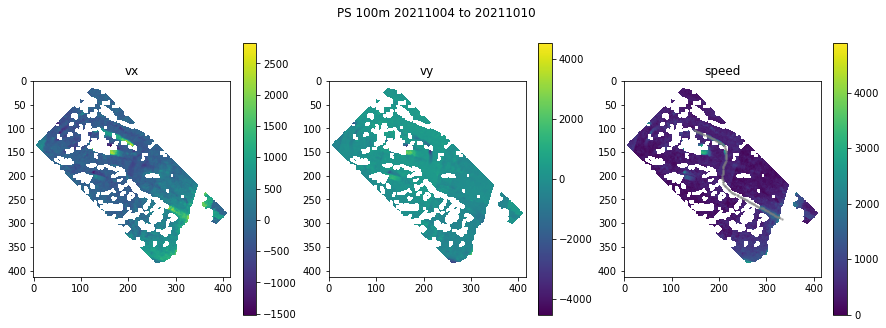

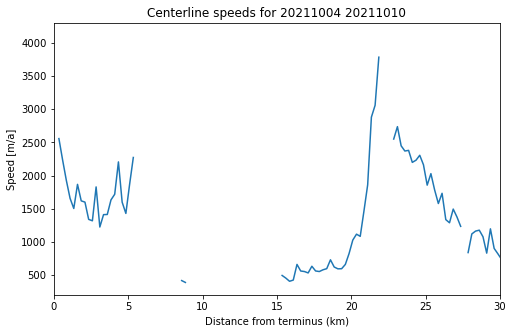

Extracting centerline data.


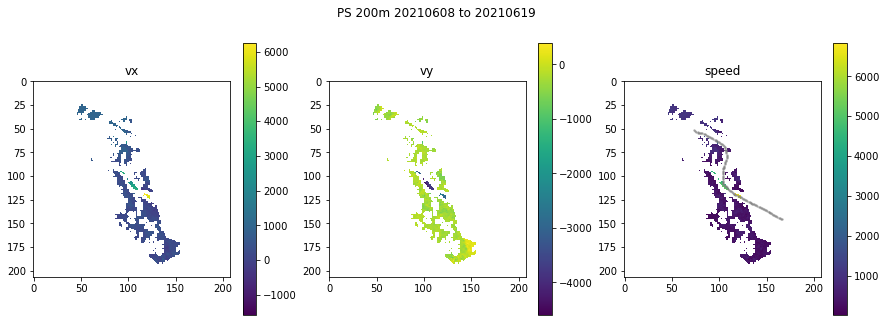

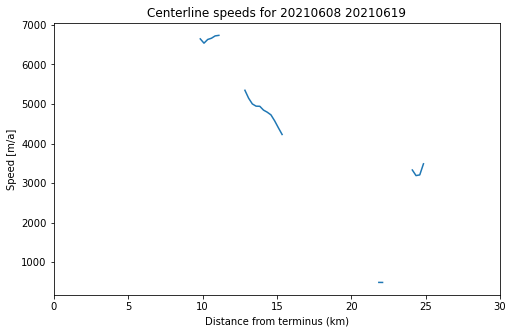

Extracting centerline data.


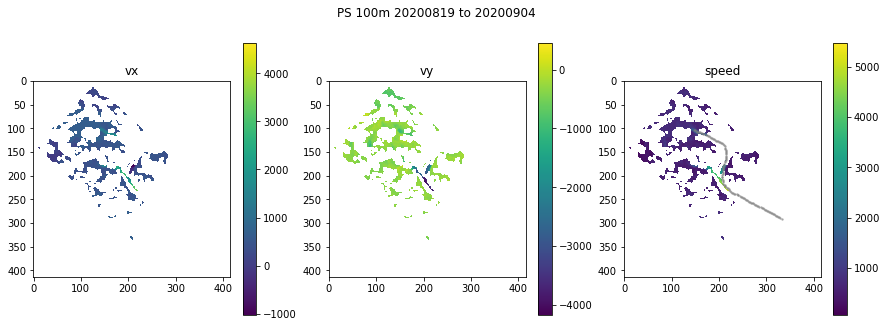

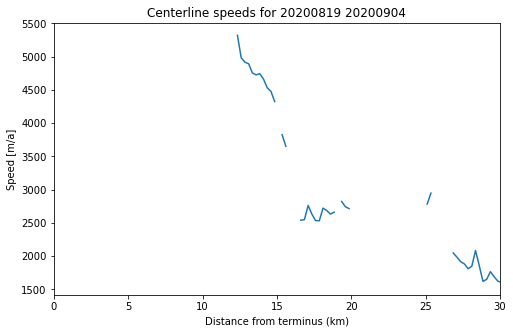

Extracting centerline data.


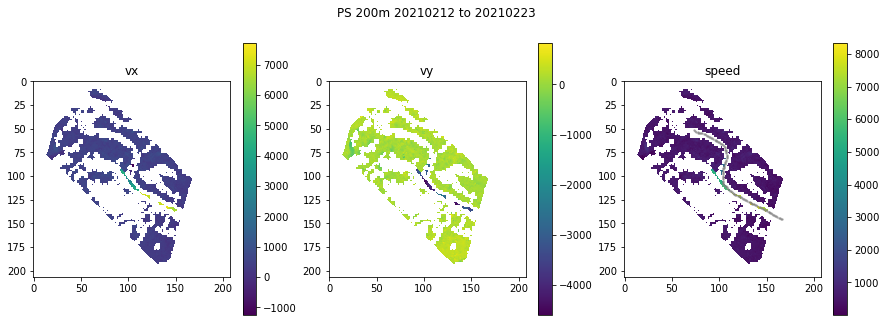

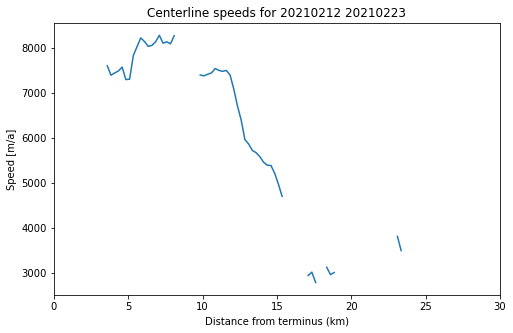

Extracting centerline data.


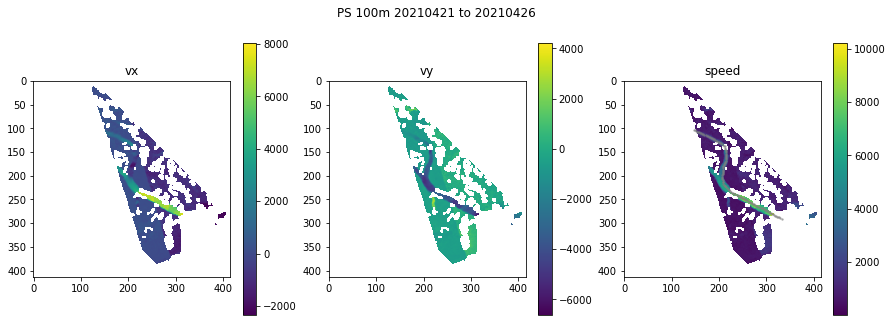

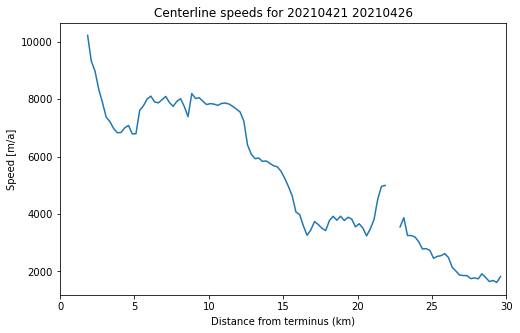

Extracting centerline data.


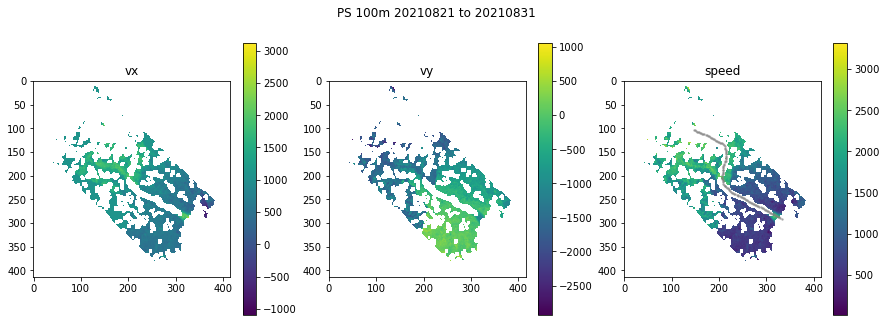

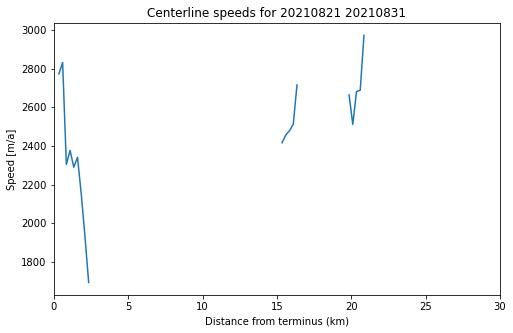

Extracting centerline data.


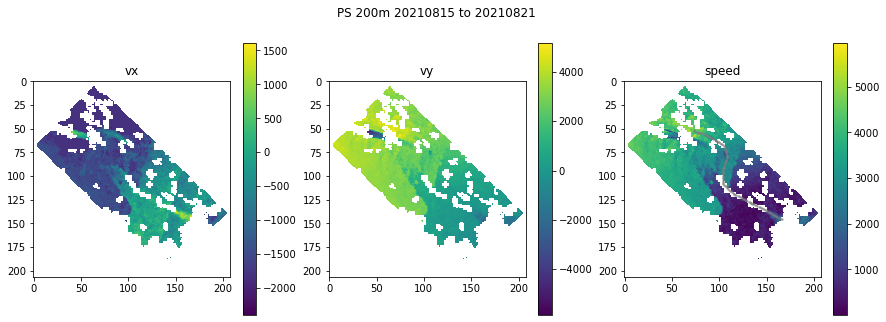

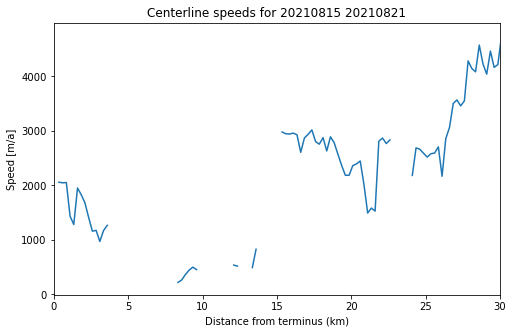

Extracting centerline data.


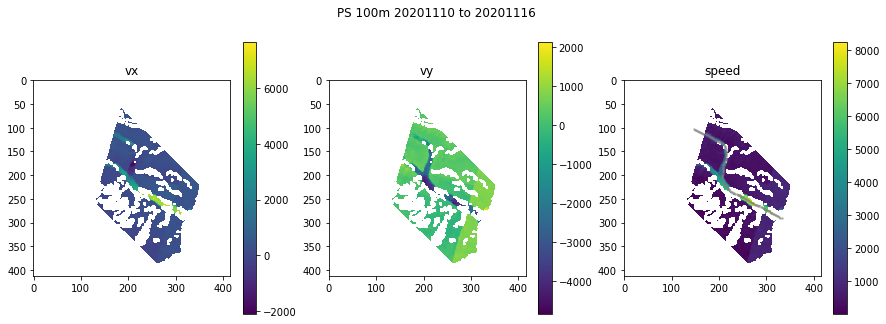

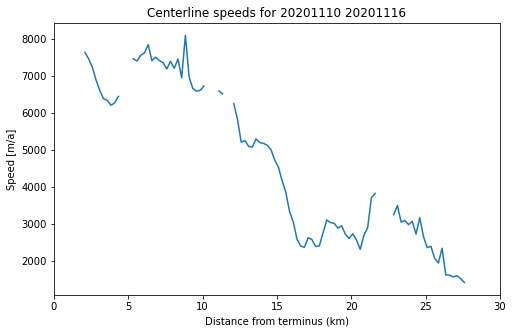

Extracting centerline data.


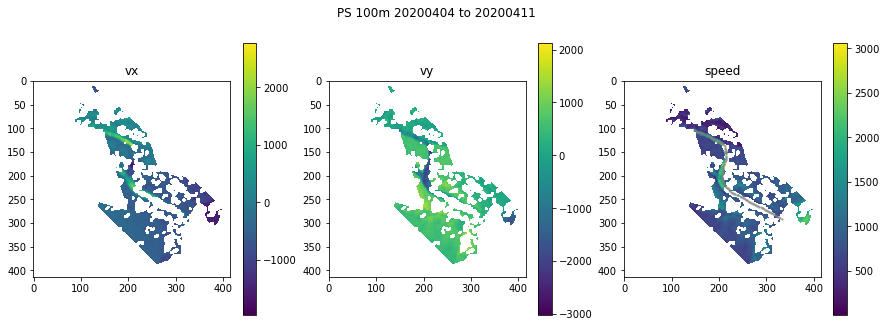

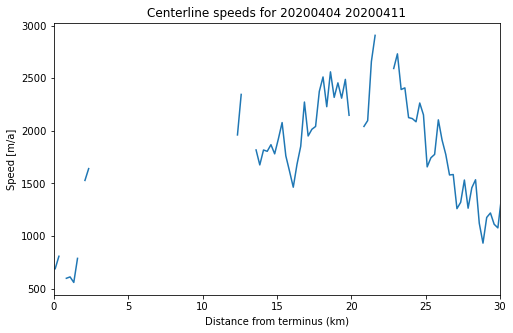

Extracting centerline data.


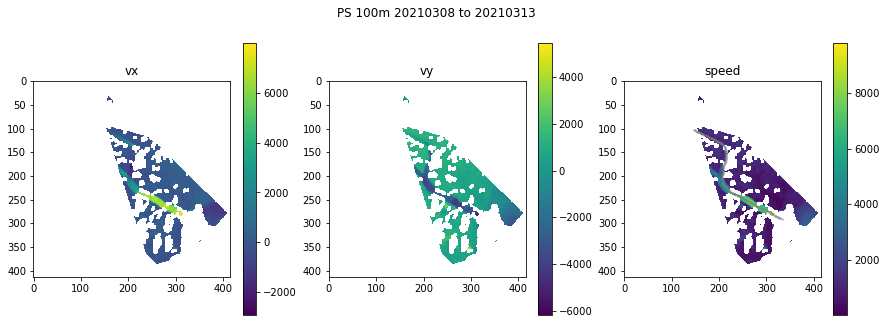

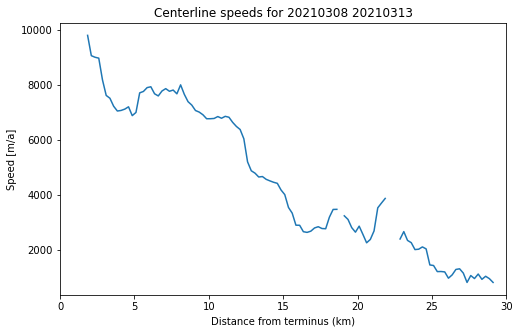

Extracting centerline data.


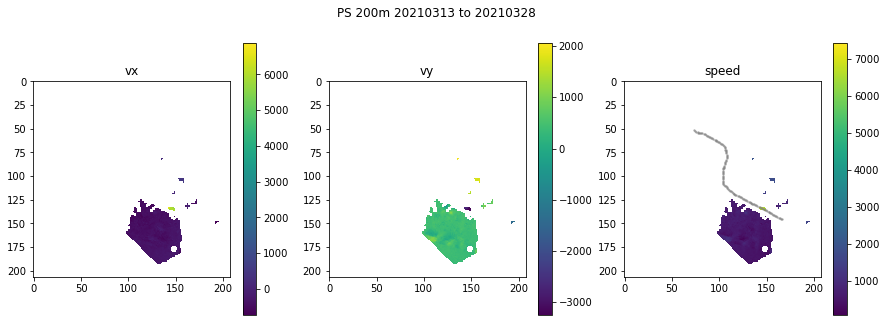

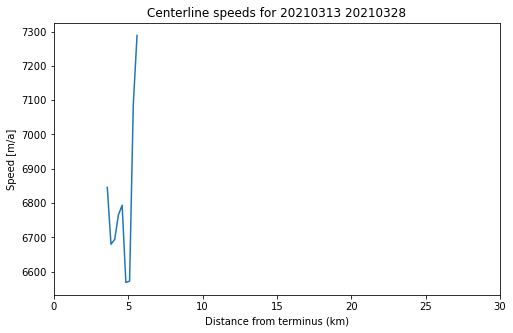

Extracting centerline data.


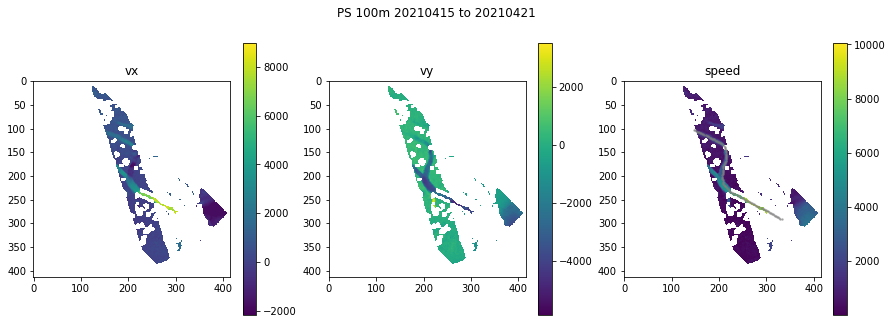

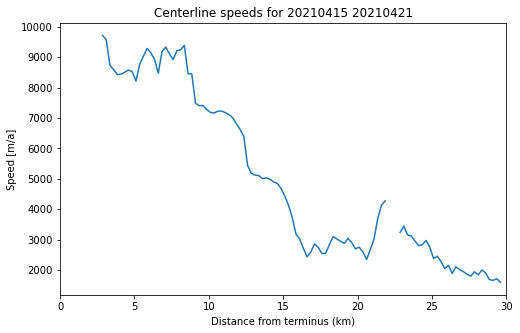

Extracting centerline data.


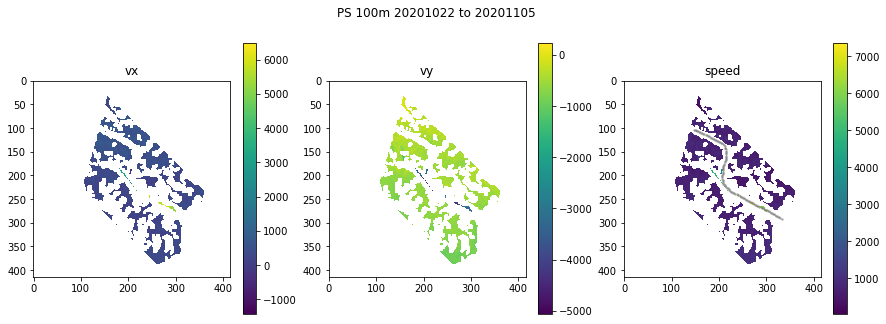

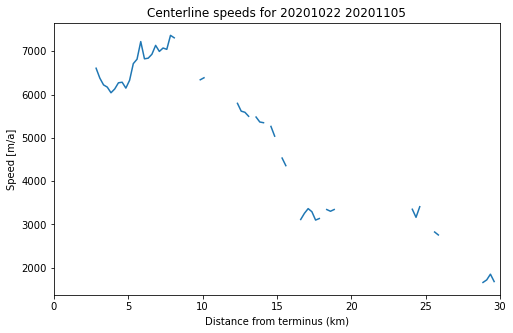

Extracting centerline data.


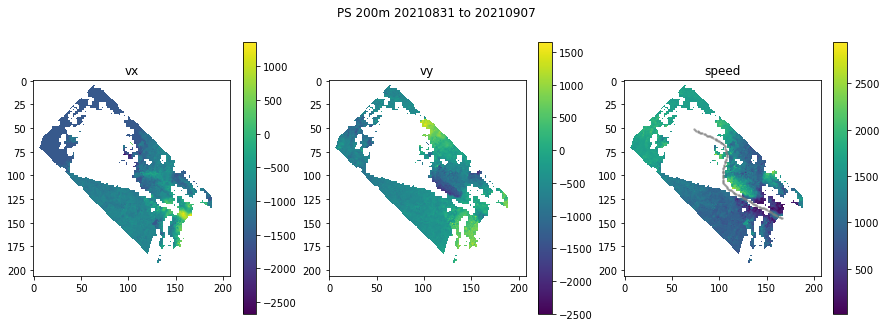

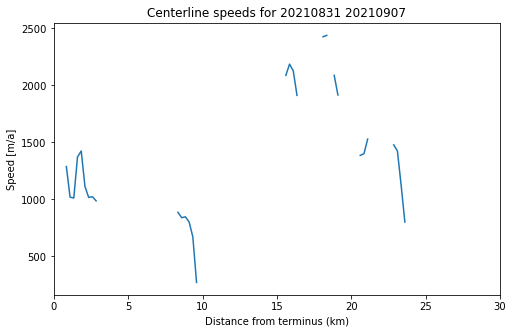

Extracting centerline data.


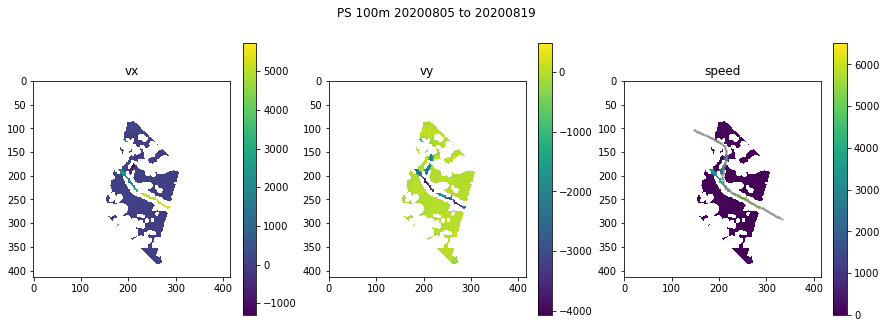

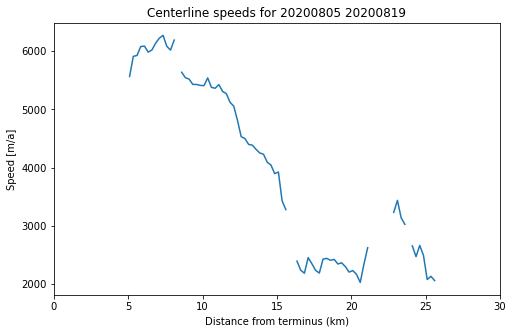

Extracting centerline data.


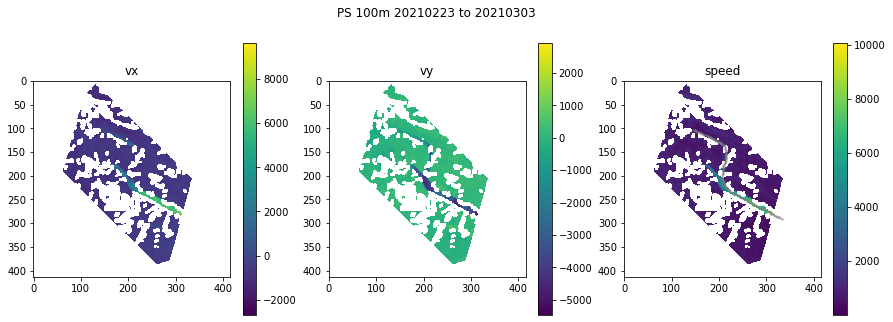

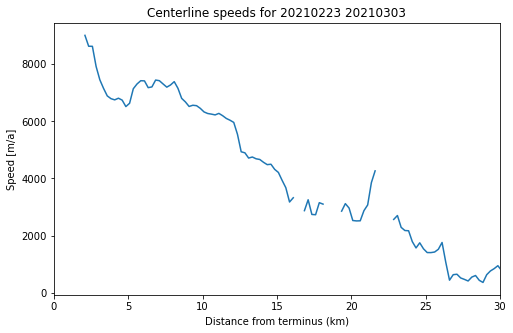

Extracting centerline data.


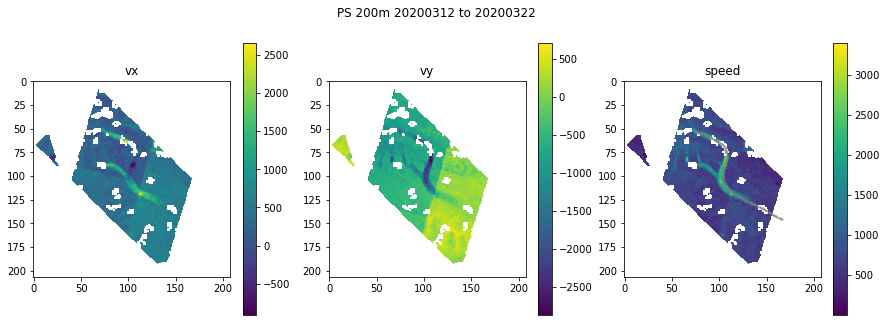

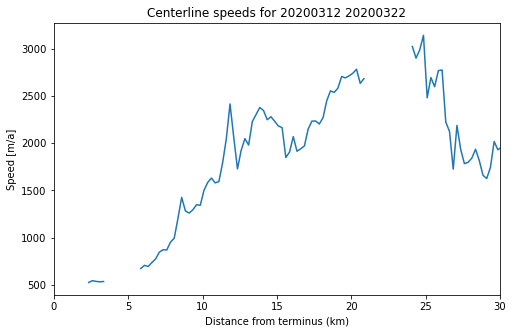

Extracting centerline data.


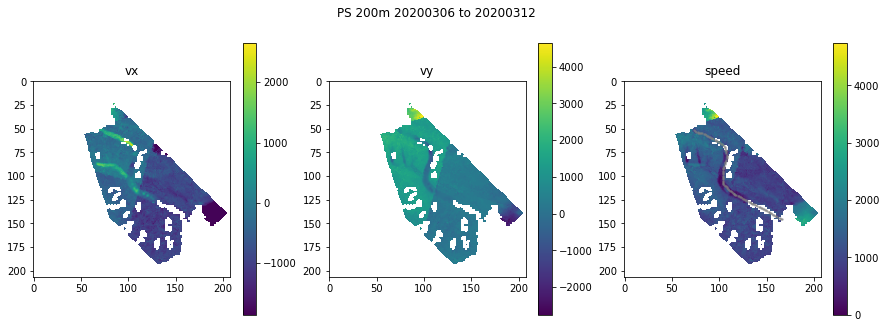

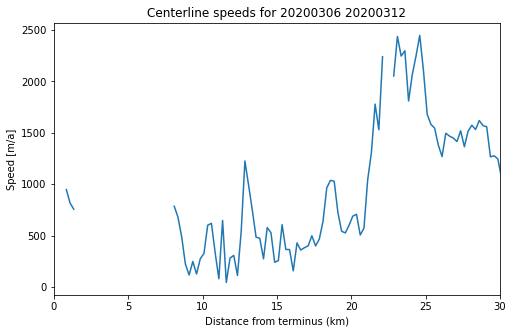

Extracting centerline data.


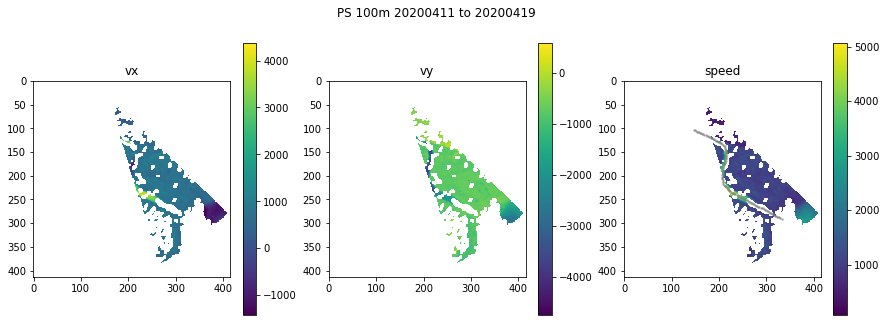

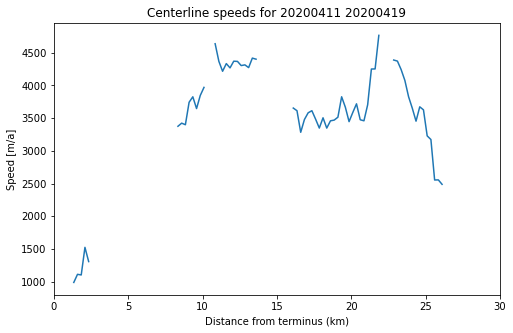

Extracting centerline data.


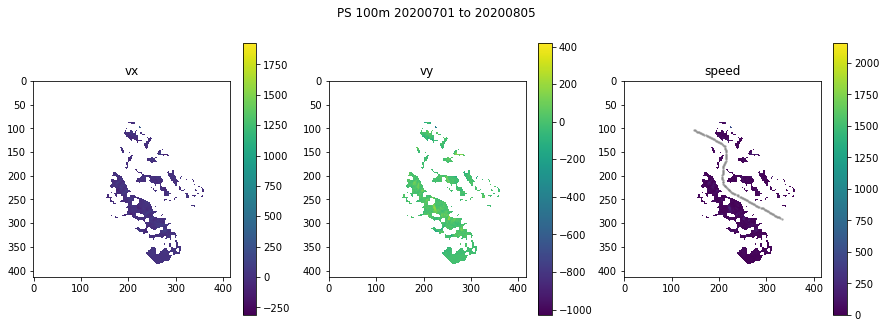

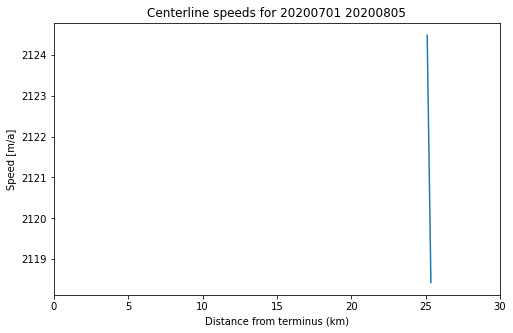

Extracting centerline data.


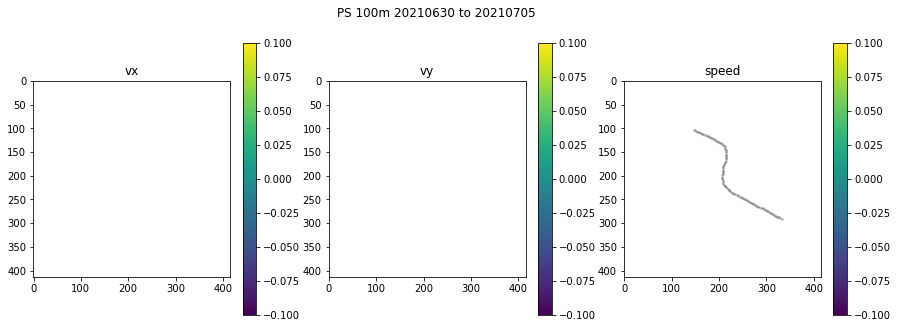

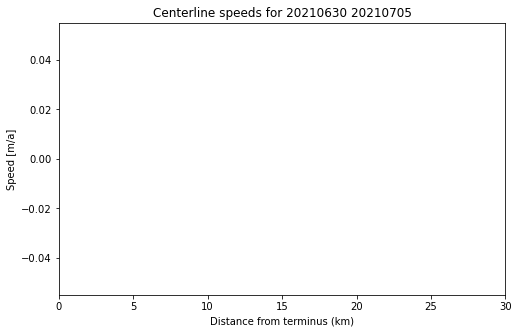

Extracting centerline data.


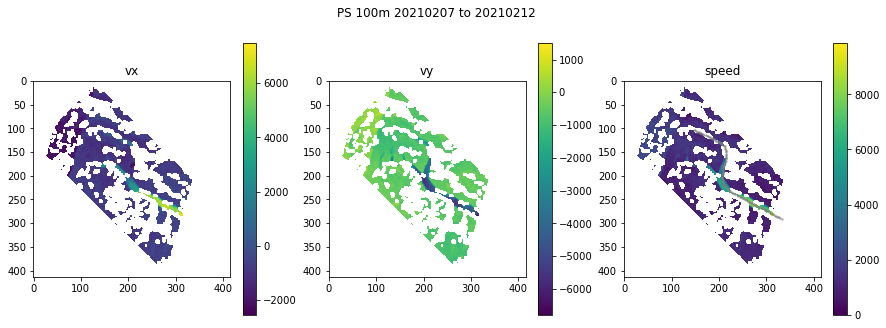

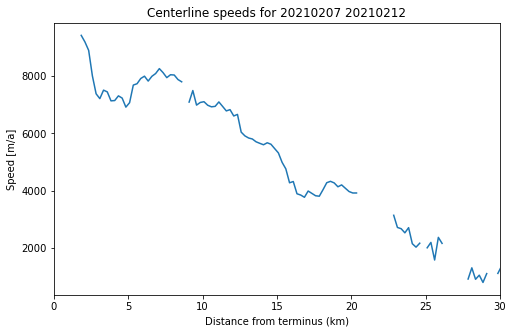

Extracting centerline data.


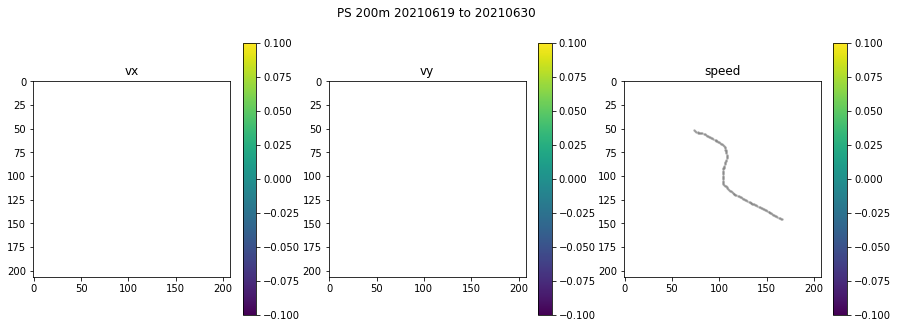

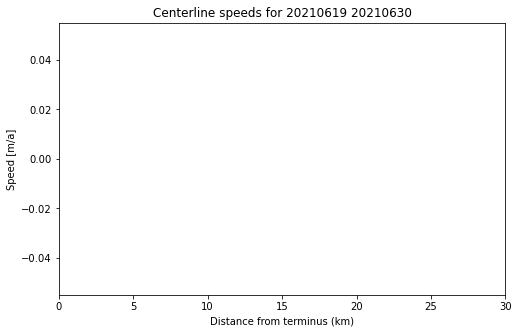

Extracting centerline data.


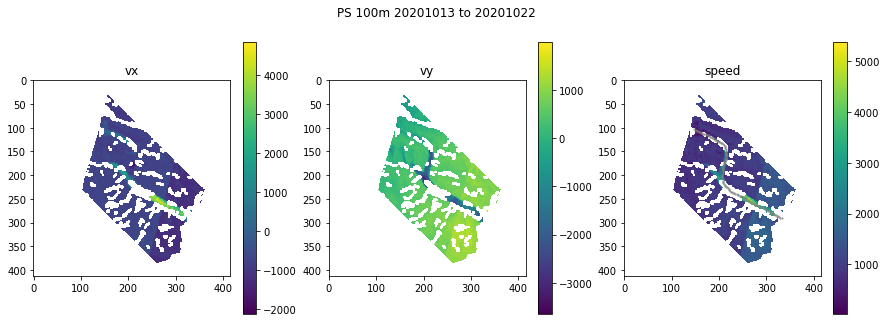

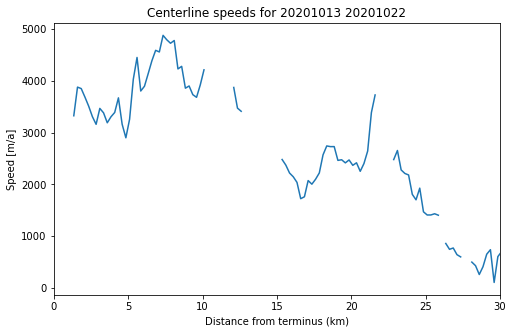

Extracting centerline data.


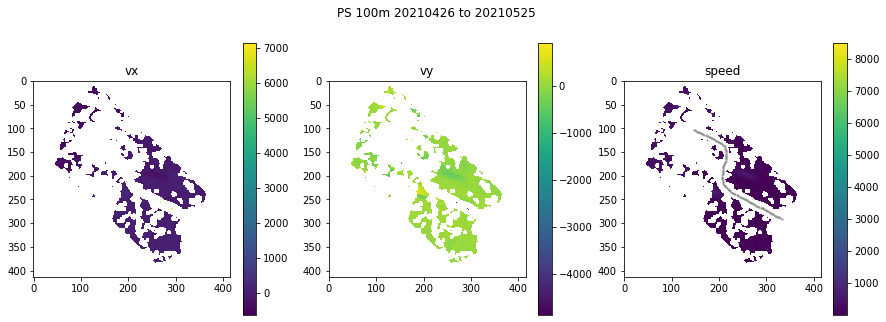

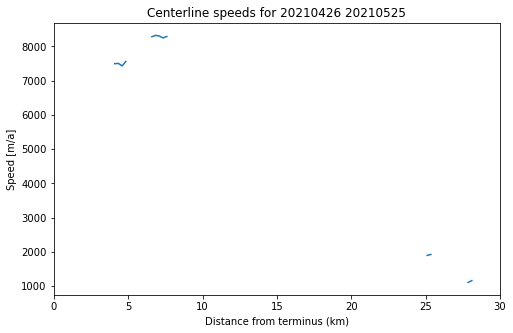

Extracting centerline data.


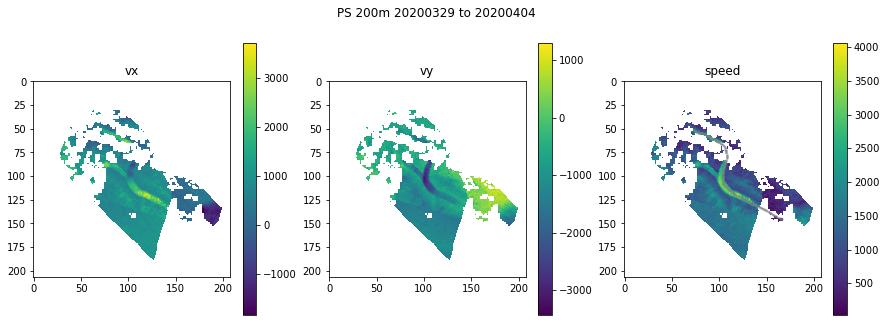

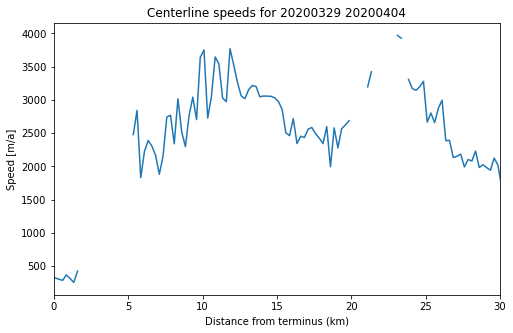

Extracting centerline data.


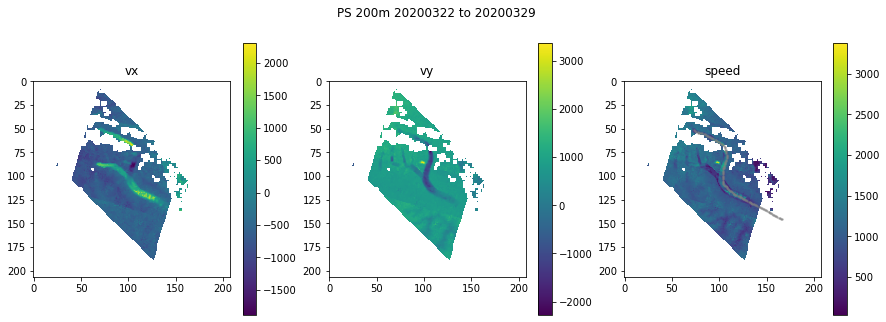

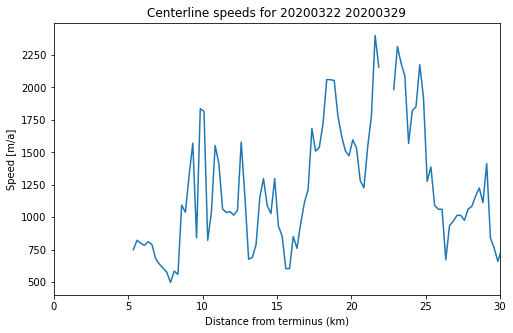

Extracting centerline data.


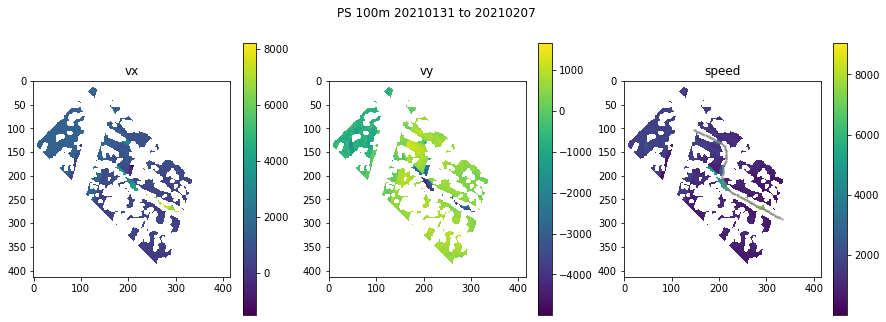

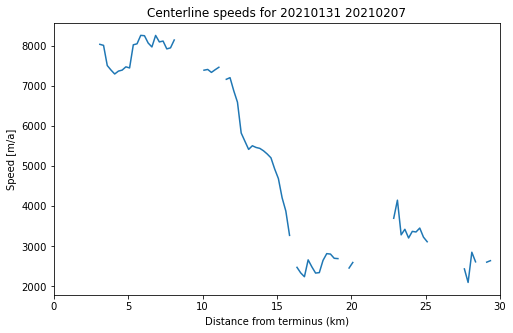

Extracting centerline data.


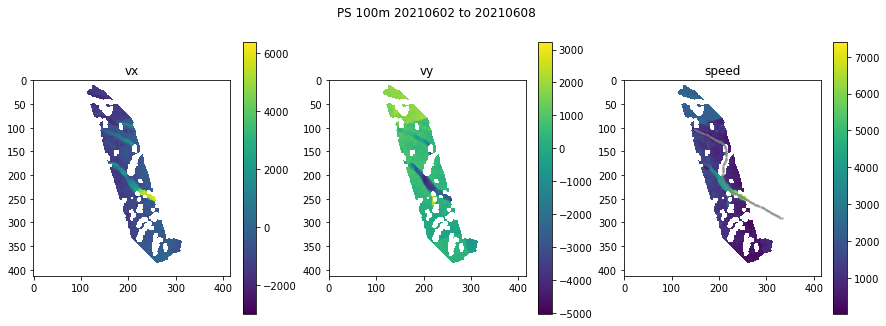

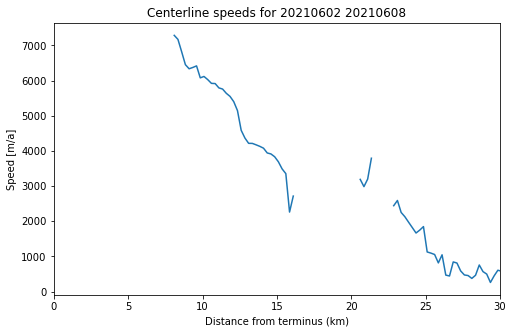

Extracting centerline data.


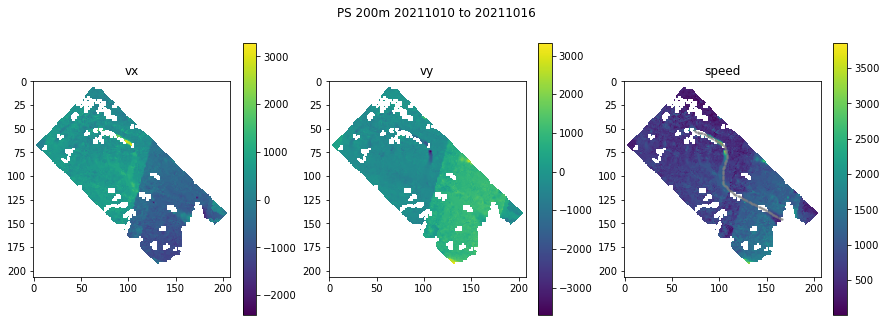

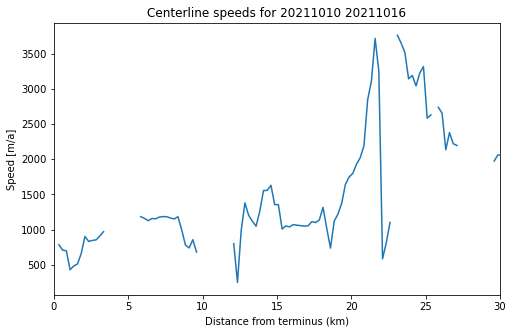

Extracting centerline data.


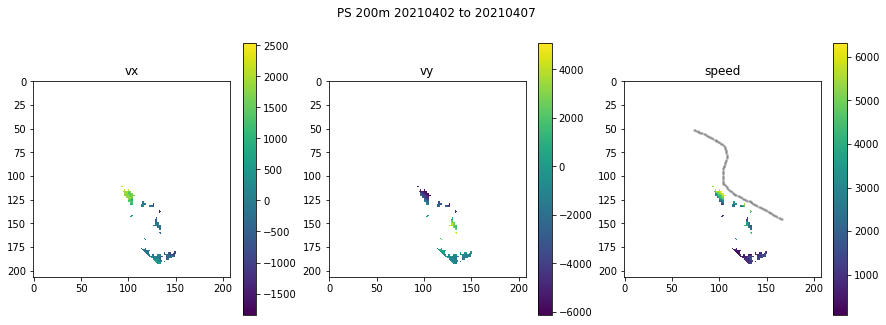

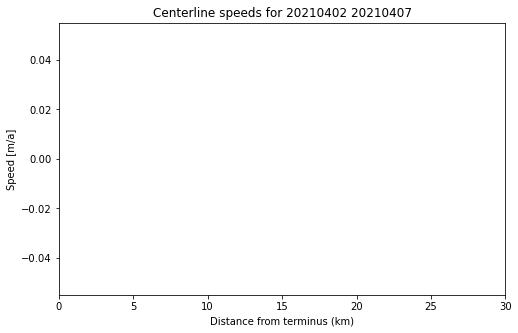

Extracting centerline data.


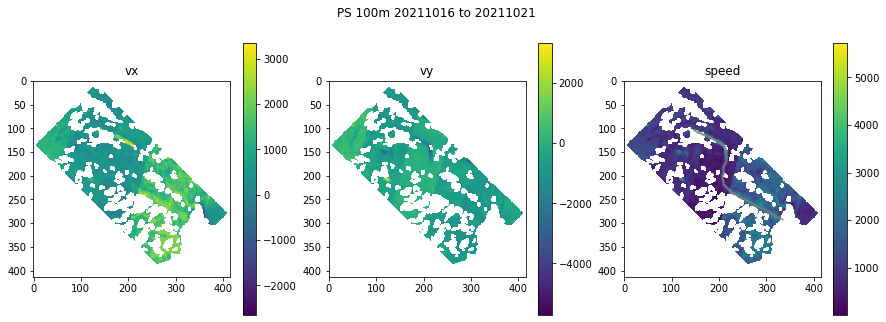

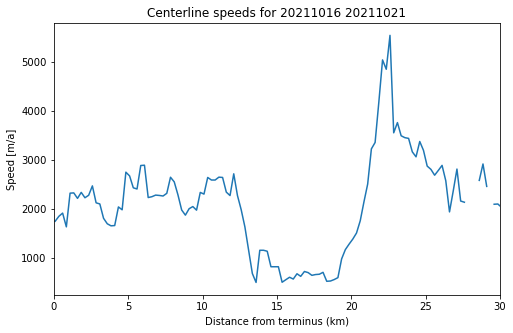

Extracting centerline data.


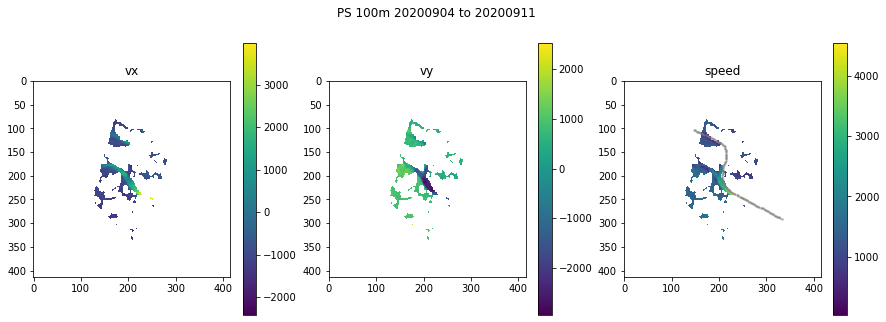

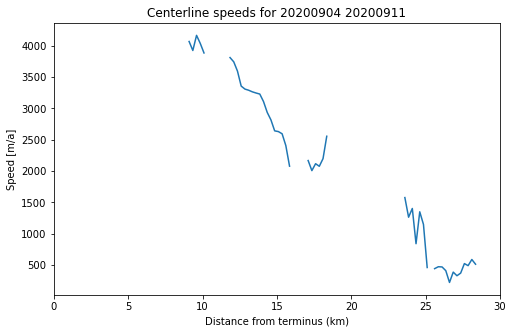

Extracting centerline data.


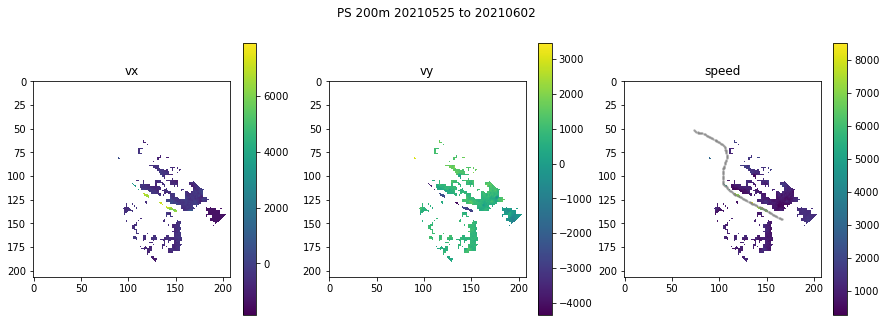

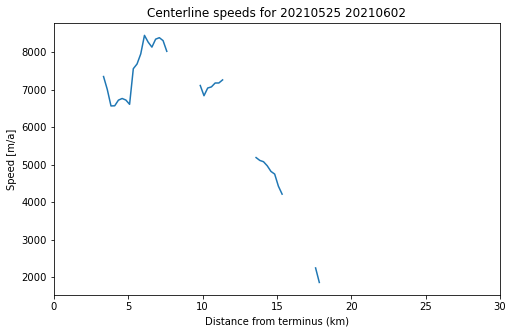

Extracting centerline data.


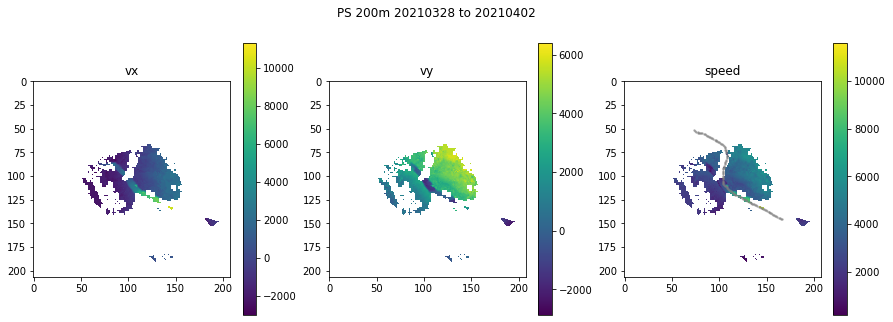

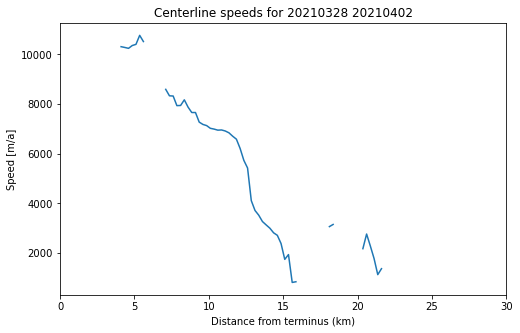

Extracting centerline data.


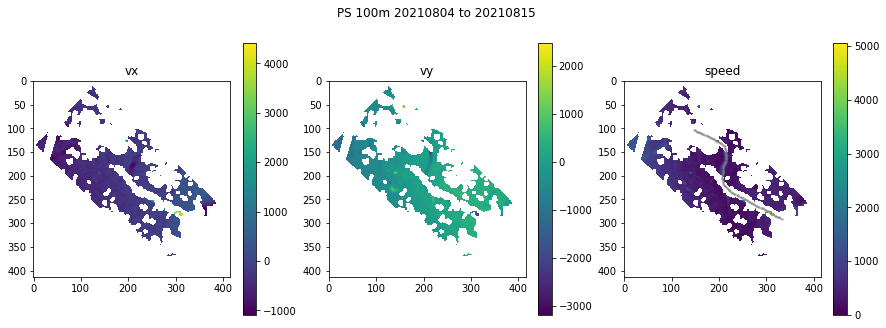

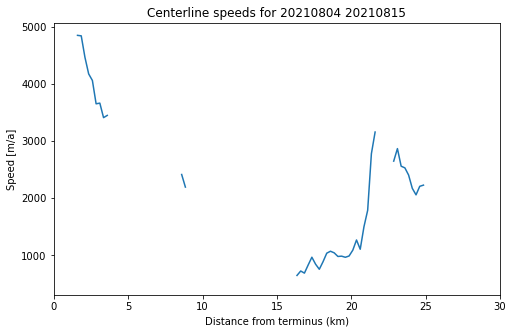

Extracting centerline data.


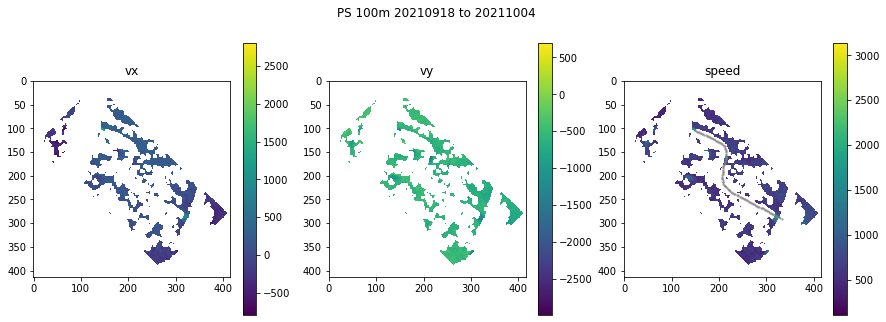

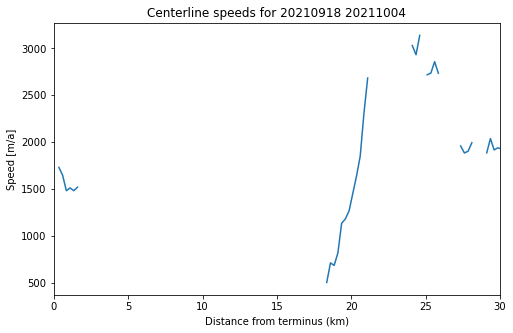

Extracting centerline data.


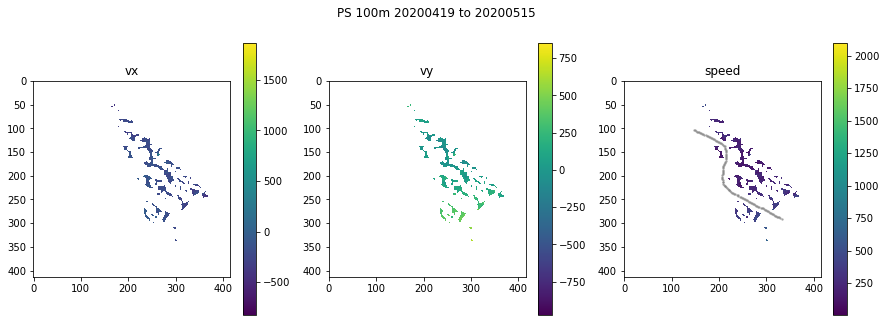

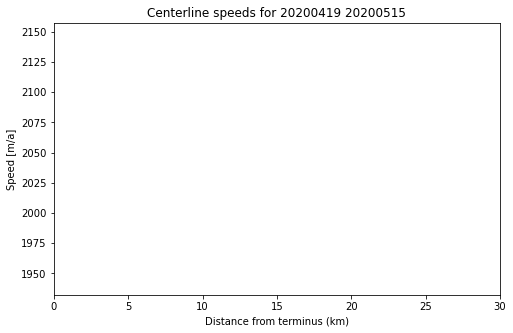

Extracting centerline data.


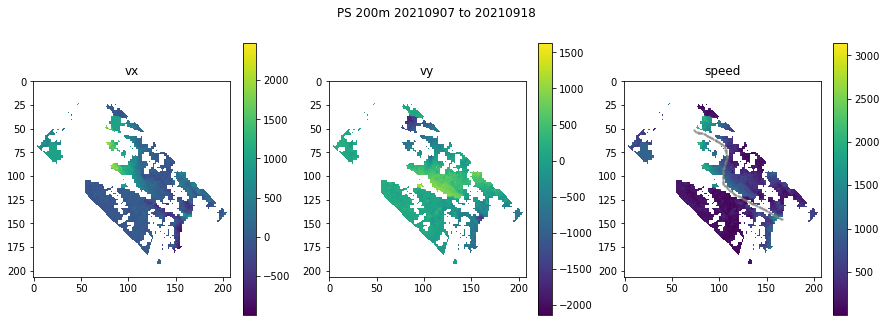

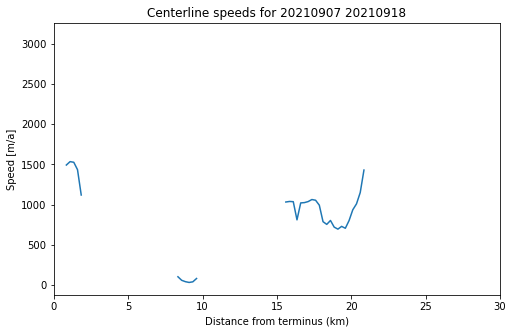

Extracting centerline data.


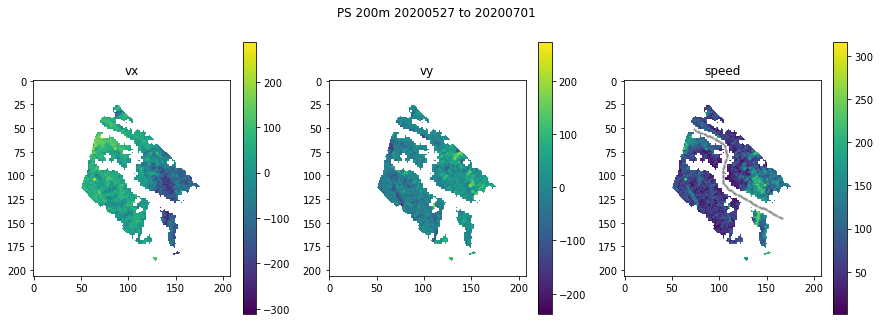

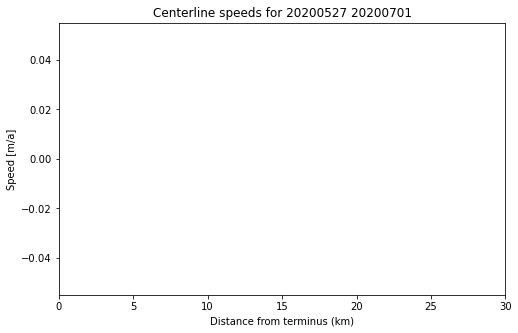

Extracting centerline data.


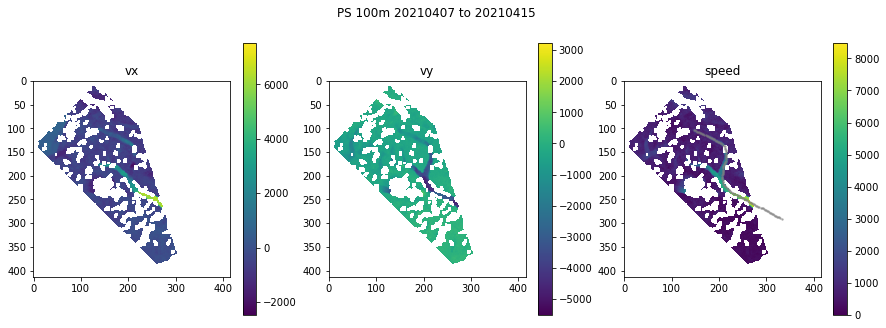

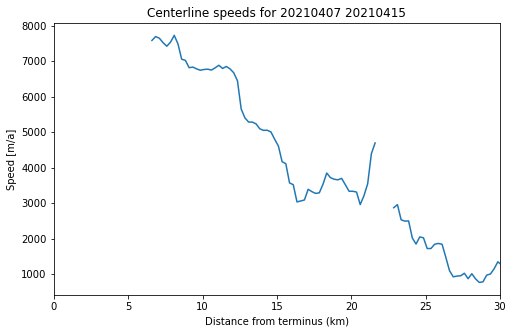

Extracting centerline data.


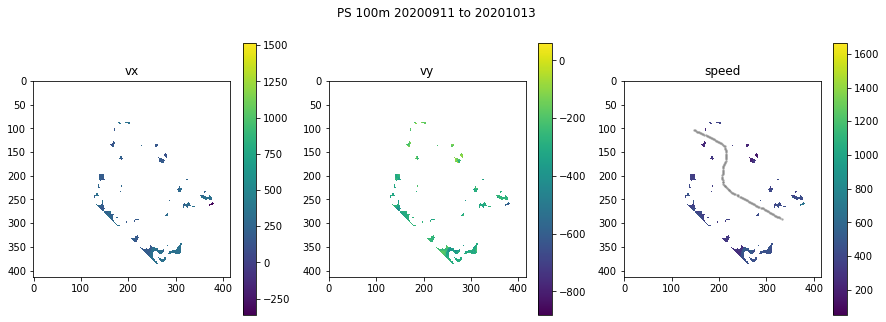

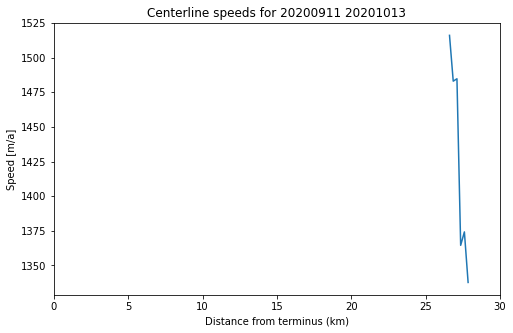

Extracting centerline data.


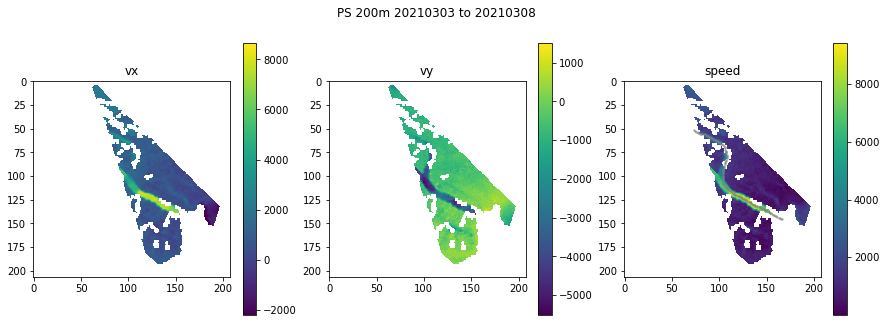

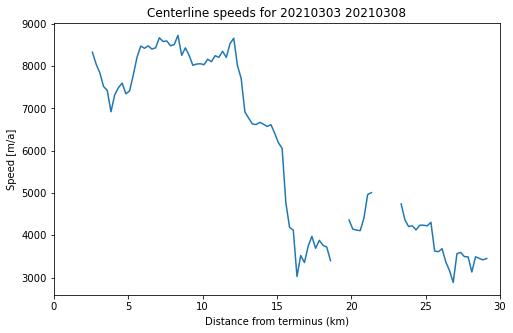

Extracting centerline data.


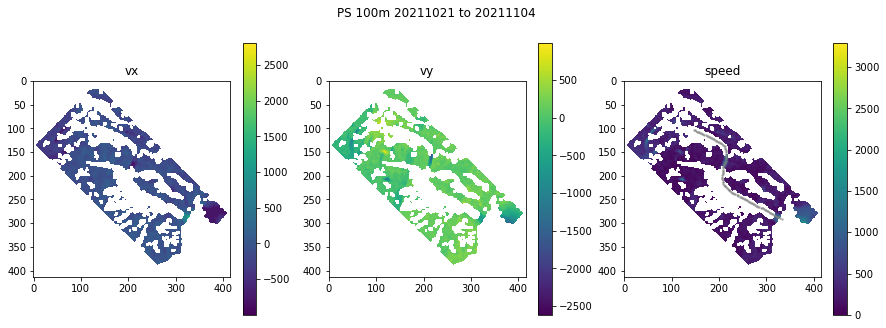

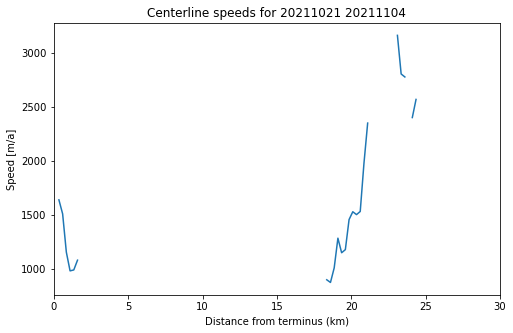

Extracting centerline data.


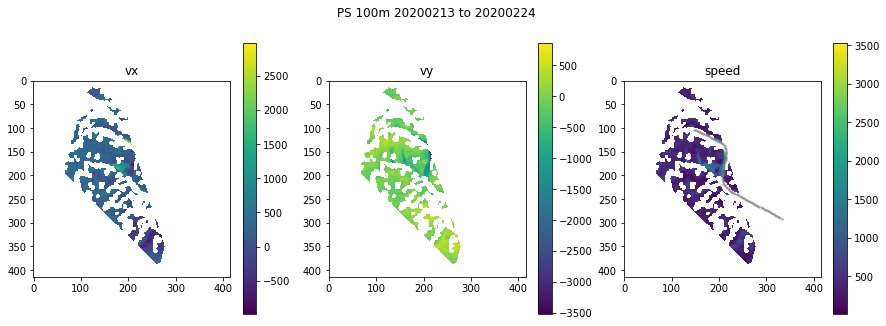

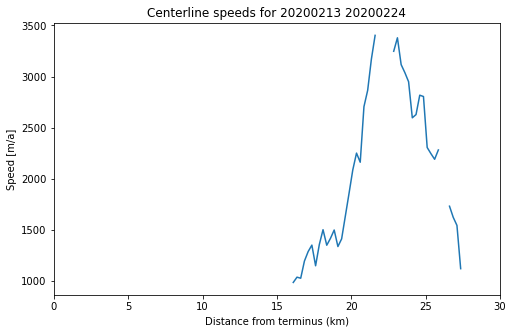

Extracting centerline data.


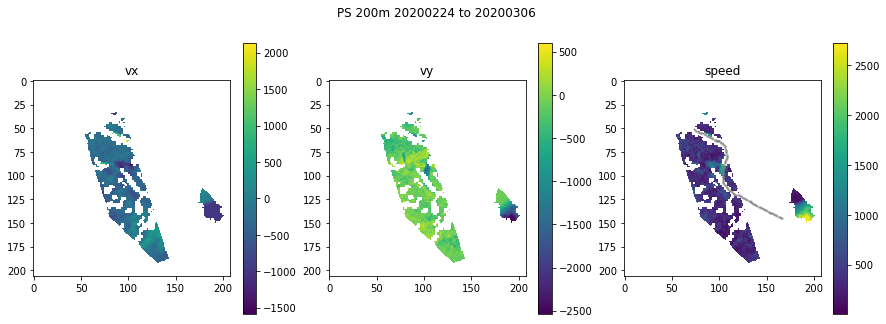

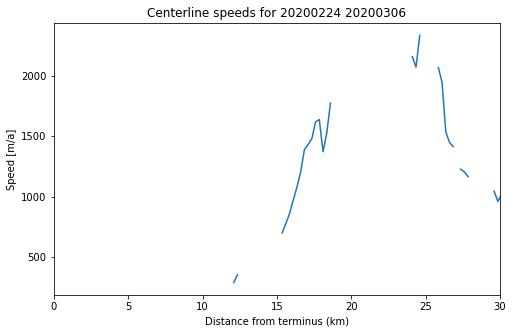

Extracting centerline data.


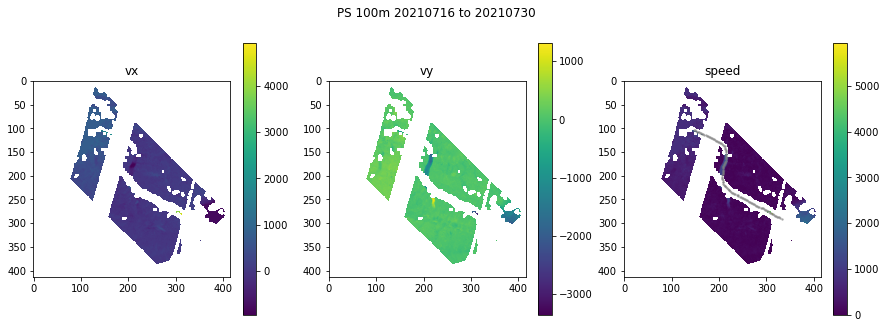

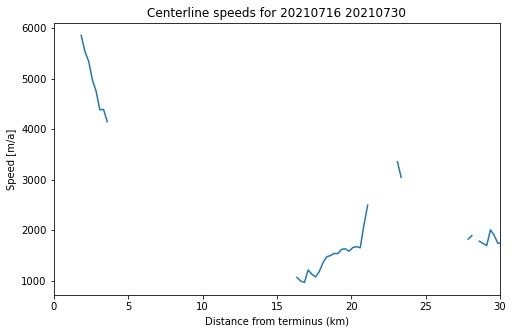

Extracting centerline data.


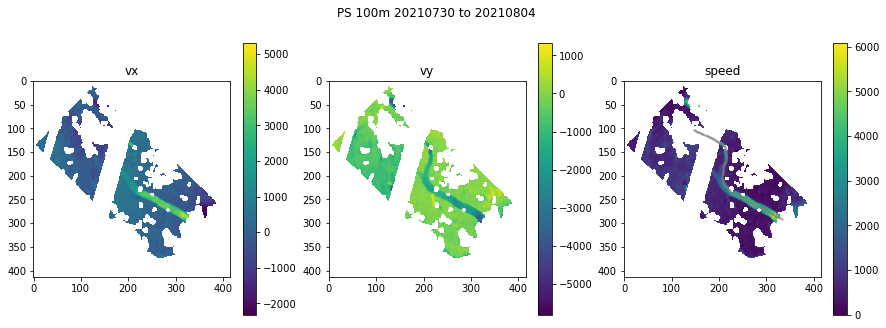

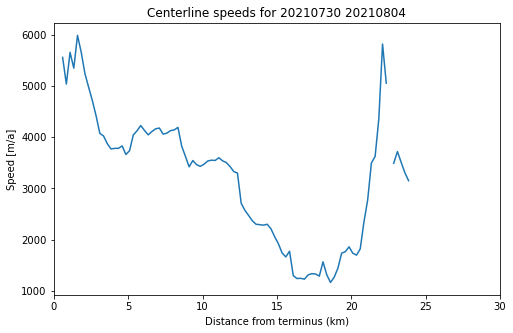

Extracting centerline data.


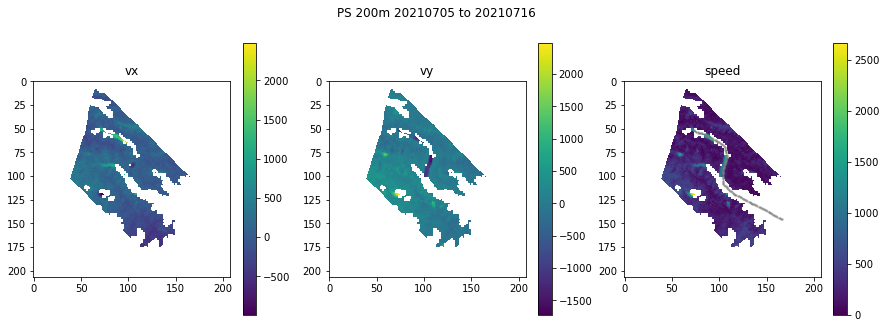

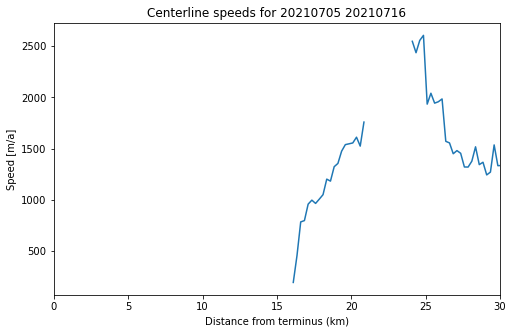

In [15]:
for output in os.listdir(autorift_outp):
    # filter by filetype and chip size
    if output.startswith('velocity') and output.endswith('.tif'):
        [filetype, ds1, ds2, chipsize, sat] = output.split('_') # grab info from filename
        sat = sat.split('.')[0] # s
        d1 = datetime.datetime.strptime(ds1, '%Y%m%d'); d2 = datetime.datetime.strptime(ds2, '%Y%m%d')
        
        if d1 > startdate and d2 < enddate:
#         ds1s.append(ds1); ds2s.append(ds2); chipsizes.append(int(chipsize[:-1])); sats.append(sat)
        
#         if os.path.exists(cline_outpath+'/'+ds1+'_'+ds2+'_'+sat+'_'+chipsize+'.csv'):
#             print('Centerline data already extracted.')
#         else:
            print('Extracting centerline data.')
            v_reader = rio.open(autorift_outp+output)
            vx = v_reader.read(1); vy = v_reader.read(2);
            if v_reader.read().shape[0] < 3: # if number of bands < 3
                print('Number of bands is less than 3. Skip speed calculations and use only vx, vy.')
                use_speed = False
            else:
                v = v_reader.read(3)
                use_speed = True

            # raster grid value (UTM coordinates)
            x_vals = np.arange(v_reader.bounds.left, v_reader.bounds.right+1, v_reader.transform[0])
            y_vals = np.arange(v_reader.bounds.bottom, v_reader.bounds.top+1, v_reader.transform[0])

            # Plot the results
            fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(15,5))
            im1 = ax1.imshow(vx); ax1.set_title('vx'); fig.colorbar(im1, ax=ax1)
            im2 = ax2.imshow(vy); ax2.set_title('vy'); fig.colorbar(im2, ax=ax2)
            if use_speed:
                im3 = ax3.imshow(v); ax3.set_title('speed'); fig.colorbar(im3,ax=ax3)
            plt.suptitle(sat+' '+chipsize+' '+ds1+' to '+ds2+' ')

            cline_v = []; cline_vx = []; cline_vy = []; dists = []
            # extract velocity along the centerline
            for pt in cline:
                [UTMx,UTMy] = pt['geometry']['coordinates'] # UTMx and y
                dist_m = pt['properties']['distance'] # distance from terminus

                # find closest velocity raster grid cell
                y_idx = np.nanargmin(np.abs(y_vals - UTMy))
                y_idx = vx.shape[0] - y_idx # flip the yidx
                x_idx = np.nanargmin(np.abs(x_vals - UTMx))

                # append centerlinve velocities to lists
                cline_vx.append(vx[y_idx, x_idx])
                cline_vy.append(vy[y_idx, x_idx])
                if use_speed:
                    cline_v.append(v[y_idx, x_idx])
                else:
                    cline_v.append(np.NaN)
                dists.append(dist_m)
                ax3.plot(x_idx,y_idx, '.', color='gray', markersize=3, alpha=0.5)
                
            plt.show()

            if use_speed:
                if n_or_s == 'n':
                    dists = np.flip(dists) # flip dists for northern centerline
                cline_df = pd.DataFrame(list(zip(dists, cline_v, cline_vx ,cline_vy)),
                                        columns=['dist_m', 'v','vx','vy'])

                # plot centerline speed
                plt.figure(figsize=(8,5)); plt.plot(cline_df.dist_m/1000, cline_df.v);
                plt.title('Centerline speeds for '+ds1+' '+ds2)
                plt.xlim(0, 30); #plt.ylim(0,25)
                plt.xlabel('Distance from terminus (km)'); plt.ylabel('Speed [m/a]')
                plt.show();

            # write to csv
            cline_df.to_csv(cline_outpath+'/'+ds1+'_'+ds2+'_'+sat+'_'+chipsize+'.csv')

In [6]:
# # filter velocities > 4 m/d for Variegated
# if not os.path.exists(cline_outpath+'bad_velocities_above2/'):
#     os.mkdir(cline_outpath+'bad_velocities_above2/')

# for file in os.listdir(cline_outpath):
#     if file.endswith('.csv'):
#         cline_df = pd.read_csv(cline_outpath+file)
        
#         if 'S1' not in file:
#             if len(cline_df[cline_df.v > 2*365]) > 0:
#                 print(file)
#                 # move to bad_velocities/
#                 shutil.move(cline_outpath+file, cline_outpath+'bad_velocities_above2/'+file)
#         else:
#             if len(cline_df[cline_df.vmag > 2*365]) > 0:
#                 print(file)
#                 shutil.move(cline_outpath+file, cline_outpath+'bad_velocities_above2/'+file)

In [12]:
cline_df

,Unnamed: 0,dist_m,v,vx,vy
0,0,0.0,NaN,NaN,NaN
1,1,250.0,NaN,NaN,NaN
2,2,500.0,NaN,NaN,NaN
3,3,750.0,NaN,NaN,NaN
4,4,1000.0,NaN,NaN,NaN
...,...,...,...,...,...
67,67,16750.0,98.370186,66.833496,-72.180176
68,68,17000.0,45.446777,21.386719,-40.100098
69,69,17250.0,33.067387,32.080080,-8.020020
70,70,17500.0,26.733398,16.040040,21.386719


# 2) Extract speed time series at specific points on the glacier

In [12]:
# read in the shapefiles with points in zones
######################################################################
zoneptpath = '/Users/jukesliu/Documents/TURNER/DATA/shapefiles_gis/cline_points_in_zones.shp'
zone_pts = fiona.open(zoneptpath)
######################################################################
for pt in zone_pts:
    km_mark = int(30 - pt['properties']['distance']/1000)
    print(km_mark)

17
22
28
24
18
15
9
5
1


In [13]:
# initialize lists to store info for each velocity map
ds1s = []; ds2s = []; dts = []; chipsizes = []; sats = []; data_fracs = []; err_vx = []; err_vy = []; err_v = []; 
s1 = []; s5 = []; s9 = []; s15 = []; s18 = []; s24 = []; s28 = []; s22 = []; s17 = [] # lists to hold speed at pts along centerline

file_count = 0
# for each velocity map
for output in os.listdir(autorift_outp):
    if output.startswith('velocity') and output.endswith('.tif') and 'PS' not in output:
#         print(output)
        [filetype, ds1, ds2, chipsize, sat] = output.split('_') # grab info from filename
        d1 = datetime.datetime.strptime(ds1, '%Y%m%d'); d2 = datetime.datetime.strptime(ds2, '%Y%m%d')
        dt = d2-d1
        sat = sat.split('.')[0] # s
        ds1s.append(ds1); ds2s.append(ds2); dts.append(dt.days)
        chipsizes.append(int(chipsize[:-1])); sats.append(sat)
        
        # read in the velocity map
        v_reader = rio.open(autorift_outp+output)
        vx = v_reader.read(1); vy = v_reader.read(2) # grab vx and vy
        v = np.sqrt(vx**2 + vy**2) # calculate vmag from vx and vy
        # raster grid value (UTM coordinates)
        x_vals = np.arange(v_reader.bounds.left, v_reader.bounds.right+1, v_reader.transform[0])
        y_vals = np.arange(v_reader.bounds.bottom, v_reader.bounds.top+1, v_reader.transform[0])
        
        # Read in stable surface mask
        ssm_reader = rio.open(refvpath+'ssm_'+chipsize+'.tif') # stable surface mask
        ssm = ssm_reader.read(1)
        if ssm.shape != vx.shape:
            ssm = ssm[:vx.shape[0],:vx.shape[1]]
        
        # grab data fraction in glacier outline
        cropped_img, cropped_transform = mask(v_reader, shapes, nodata= -3e5, crop=True)
        if cropped_img.shape[0] == 3:
            cropped_v = cropped_img[2] # grab the third band [2]
        else:
            cropped_vx = cropped_img[0]; cropped_vy = cropped_img[1]
            cropped_v = np.sqrt(cropped_vx**2 + cropped_vy**2) 
        cropped_v_filled = cropped_v.copy()
        cropped_v_filled[np.isnan(cropped_v_filled)] = 0 # fill all Nans with 0
        total_pixels = np.count_nonzero(cropped_v_filled >= 0) # count number of non-nodata values (negative)
        cropped_v[cropped_v < 0] = np.NaN # turn no data values (negative) into NaNs
        pixels_w_data = len(cropped_v[cropped_v >= 0]) # count non Nans (number of pixels with data)
        if pixels_w_data > 0:
            data_percent = int(pixels_w_data/total_pixels*100)
            data_fracs.append(data_percent)
            empty = False
        else:
            data_fracs.append(0)
            empty = True
#         plt.imshow(cropped_v); plt.colorbar(); plt.title(str(data_percent)+' %'); plt.show() # check visually
            
        # if no data left, just append nans to all the lists
        if empty: 
            for speedlist in [s1, s5, s9, s15, s18, s24, s28, s22, s17]:
                speedlist.append(np.NaN)
        # otherwise, extract the values
        else:
            for pt in zone_pts:
                [UTMx,UTMy] = pt['geometry']['coordinates'] # UTMx and y
                km_mark = int(30 - pt['properties']['distance']/1000)

                # find closest velocity raster grid cell
                y_idx = np.nanargmin(np.abs(y_vals - UTMy))
                y_idx = vx.shape[0] - y_idx # flip the yidx
                x_idx = np.nanargmin(np.abs(x_vals - UTMx))
                s = v[y_idx, x_idx]

                if km_mark == 1:
                    s1.append(s)
                elif km_mark == 5:
                    s5.append(s)
                elif km_mark == 9: 
                    s9.append(s)
                elif km_mark == 15:
                    s15.append(s)
                elif km_mark == 18:
                    s18.append(s)
                elif km_mark == 24:
                    s24.append(s)
                elif km_mark == 28:
                    s28.append(s)
                elif km_mark == 22:
                    s22.append(s)
                elif km_mark == 17:
                    s17.append(s)
                else:
                    print(km_mark, 'km mark not recognized.')
        
        # Grab off-ice velocities using stable surface mask
        ssm[ssm > 0] = 2 # turn ice into 2
        ssm[ssm == 0] = 1 # turn stable surfaces into 1
        ssm[ssm == 2] = 0 # turn ice into 0s
        ssm_masked_vx = ssm*vx; ssm_masked_vy = ssm*vy; ssm_masked_v = ssm*v 
        
        # calculate RMSE [m/d]
        err_vx.append(np.sqrt(np.nanmean(ssm_masked_vx**2))/365)
        err_vy.append(np.sqrt(np.nanmean(ssm_masked_vy**2))/365)
        err_v.append(np.sqrt(np.nanmean(ssm_masked_v**2))/365)
        
        # get ready for next iteration
        del v, vx, vy, empty
        file_count += 1
        
print(file_count, 'files found.')

/var/folders/mr/7f69f7y50zj85n420pyvh8cr0000gq/T/ipykernel_27094/3923941966.py:96: RuntimeWarning: Mean of empty slice
  err_vx.append(np.sqrt(np.nanmean(ssm_masked_vx**2))/365)
/var/folders/mr/7f69f7y50zj85n420pyvh8cr0000gq/T/ipykernel_27094/3923941966.py:97: RuntimeWarning: Mean of empty slice
  err_vy.append(np.sqrt(np.nanmean(ssm_masked_vy**2))/365)
/var/folders/mr/7f69f7y50zj85n420pyvh8cr0000gq/T/ipykernel_27094/3923941966.py:98: RuntimeWarning: Mean of empty slice
  err_v.append(np.sqrt(np.nanmean(ssm_masked_v**2))/365)


916 files found.


In [14]:
df = pd.DataFrame(list(zip(ds1s, ds2s, chipsizes, sats, dts, data_fracs, err_vx, err_vy, err_v,
                          s1, s5, s9, s15, s18, s24, s28, s22, s17)),
                 columns=['ds1','ds2','min_chip_size','sat','dt_days','data_percent',
                          'err_vx','err_vy','err_v',
                          's1', 's5', 's9','s15','s18','s24', 's28', 's22', 's17'])
df.sort_values(by=['ds1','min_chip_size','sat'])

,ds1,ds2,min_chip_size,sat,dt_days,data_percent,err_vx,err_vy,err_v,s1,s5,s9,s15,s18,s24,s28,s22,s17
70,20130414,20130610,100,LS,57,72,0.116903,0.120953,0.168214,NaN,NaN,NaN,NaN,533.351807,288.854706,827.349304,56.686417,NaN
783,20130414,20130610,200,LS,57,72,0.051978,0.063732,0.082241,NaN,NaN,NaN,107.230591,65.454353,NaN,823.519409,62.828735,NaN
547,20130414,20130610,300,LS,57,72,0.046702,0.048713,0.067484,NaN,NaN,NaN,NaN,NaN,32.393925,814.139099,122.768425,NaN
864,20130610,20130617,100,LS,7,98,0.741231,0.471731,0.878608,8260.389648,5122.472656,5184.520508,4008.500732,2546.689453,2128.065674,1515.845215,2278.287354,4141.092285
505,20130610,20130617,160,LS,7,98,0.001716,0.000964,0.001968,42.642731,26.420338,26.053986,20.793936,12.680740,11.023782,7.741378,11.567657,20.633749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,20220803,20220812,200,S2,9,34,0.181011,0.114512,0.214192,510.142395,320.008667,611.559204,NaN,NaN,NaN,NaN,NaN,NaN
328,20220803,20220812,300,S2,9,34,0.171659,0.103233,0.200310,572.034912,395.352661,299.711456,NaN,NaN,NaN,NaN,NaN,NaN
541,20220812,20220904,100,S2,23,27,0.042111,0.058965,0.072458,58.046410,35.761581,41.045006,NaN,NaN,NaN,NaN,NaN,NaN
300,20220812,20220904,200,S2,23,28,0.041963,0.054838,0.069052,35.242016,46.785366,29.755434,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
df.to_csv('/Users/jukesliu/Documents/TURNER/DATA/VELOCITY_MAPS/speed_timeseries_thru_pts_new.csv')

# 3) Plot speed time series through points in zones

In [20]:
df = pd.read_csv('/Users/jukesliu/Documents/TURNER/DATA/VELOCITY_MAPS/speed_timeseries_thru_pts_new.csv')
df.ds1 = pd.to_datetime(df.ds1,format='%Y%m%d')
df.ds2 = pd.to_datetime(df.ds2,format='%Y%m%d')
df

,Unnamed: 0,ds1,ds2,min_chip_size,sat,dt_days,data_percent,err_vx,err_vy,err_v,s1,s5,s9,s15,s18,s24,s28,s22,s17
0,0,2019-03-27,2019-04-01,160,S2,5,97,0.060632,0.514467,0.518027,645.234924,594.877197,653.250549,1633.046753,2232.888184,2710.370850,1506.488892,573.610779,707.003540
1,1,2015-05-15,2015-05-22,300,LS,7,99,0.318886,0.204550,0.378852,268.027069,530.593384,651.505615,700.444641,1198.217285,2570.041016,1434.078979,327.923340,142.519928
2,2,2022-05-19,2022-05-22,200,S2,3,33,0.270222,0.593957,0.652537,932.092224,544.375488,697.192627,NaN,NaN,NaN,NaN,NaN,NaN
3,3,2020-04-02,2020-04-05,300,S2,3,91,0.714413,0.294911,0.772889,1720.836548,1881.647095,1008.269165,4278.399902,3244.549561,3242.822510,2146.830811,2947.166504,3303.494141
4,4,2018-05-16,2018-05-31,200,S2,15,96,0.198815,0.067081,0.209827,240.284439,224.837860,323.378326,508.882996,1163.835083,2492.757812,1184.115479,808.307129,310.958344
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
911,911,2022-01-17,2022-02-02,200,LS,16,72,0.343490,0.428565,0.549229,1381.098633,223.078964,1025.982056,489.937927,3536.636475,NaN,3336.372070,NaN,619.964050
912,912,2018-10-08,2018-11-02,300,S2,25,53,0.194189,0.063969,0.204454,163.551468,223.818405,163.067474,219.486603,339.783752,NaN,NaN,NaN,138.618668
913,913,2019-08-29,2019-09-05,160,S2,7,99,0.411076,0.162019,0.441853,735.292908,677.600525,91.089828,933.570679,1113.891113,1461.734741,32.589287,212.456146,610.369812
914,914,2019-10-25,2019-11-09,200,S2,15,79,0.045898,0.052285,0.069573,11.406250,NaN,NaN,68.543037,247.573730,2140.846436,1200.284668,60.116215,62.705563


In [21]:
# df = pd.read_csv('/Users/jukesliu/Documents/TURNER/DATA/VELOCITY_MAPS/speed_timeseries_thru_pts.csv')
df = df[(df.sat == 'S2') | (df.sat == 'LS')]
df_s1 = pd.read_csv('/Users/jukesliu/Documents/TURNER/DATA/VELOCITY_MAPS/speed_timeseries_thru_pts_S1_included_filtered.csv')
df_s1.ds1 = pd.to_datetime(df_s1.ds1,format='%Y-%m-%d')
df_s1.ds2 = pd.to_datetime(df_s1.ds2,format='%Y-%m-%d')
df_s1['dt_days'] = (df_s1.ds2 - df_s1.ds1).dt.days

# concatenate the optical and S1 data together
df = pd.concat([df, df_s1])
df = df.sort_values(by='ds1')
df

,Unnamed: 0,ds1,ds2,min_chip_size,sat,dt_days,data_percent,err_vx,err_vy,err_v,...,s18,s24,s28,s22,s17,Unnamed: 0.1,Unnamed: 0.1.1,mid_date,date1,date2
70,70,2013-04-14,2013-06-10,100,LS,57,72.0,0.116903,0.120953,0.168214,...,533.351807,288.854706,827.349304,56.686417,NaN,NaN,NaN,NaN,NaN,NaN
547,547,2013-04-14,2013-06-10,300,LS,57,72.0,0.046702,0.048713,0.067484,...,NaN,32.393925,814.139099,122.768425,NaN,NaN,NaN,NaN,NaN,NaN
783,783,2013-04-14,2013-06-10,200,LS,57,72.0,0.051978,0.063732,0.082241,...,65.454353,NaN,823.519409,62.828735,NaN,NaN,NaN,NaN,NaN,NaN
505,505,2013-06-10,2013-06-17,160,LS,7,98.0,0.001716,0.000964,0.001968,...,12.680740,11.023782,7.741378,11.567657,20.633749,NaN,NaN,NaN,NaN,NaN
864,864,2013-06-10,2013-06-17,100,LS,7,98.0,0.741231,0.471731,0.878608,...,2546.689453,2128.065674,1515.845215,2278.287354,4141.092285,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
771,771,2022-08-03,2022-08-12,100,S2,9,35.0,0.178507,0.113307,0.211432,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
86,86,2022-08-03,2022-08-12,200,S2,9,34.0,0.181011,0.114512,0.214192,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
300,300,2022-08-12,2022-09-04,200,S2,23,28.0,0.041963,0.054838,0.069052,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
541,541,2022-08-12,2022-09-04,100,S2,23,27.0,0.042111,0.058965,0.072458,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
# read in terminus positions
tpos_df = pd.read_csv('/Users/jukesliu/Documents/TURNER/DATA/figures/terminus_positions_2013_2022.csv', 
                      index_col=0)
tpos_df.datetime = pd.to_datetime(tpos_df.datetime)
tpos_df = tpos_df.sort_values(by='datetime')
tpos_df.head()

,datetime,image_name,area_km2,embayment,plume,error_km2
10,2013-04-14,LC08_L1TP_062018_20130414_20200912_02_T1,7.99177,0,1,0.359
11,2013-06-10,LC08_L1TP_061018_20130610_20200912_02_T1,8.23238,0,1,0.359
9,2013-06-17,LC08_L1TP_062018_20130617_20200912_02_T1,8.13977,0,1,0.359
5,2013-07-12,LC08_L1TP_061018_20130712_20200912_02_T1,8.26437,0,1,0.359
4,2013-07-28,LC08_L1TP_061018_20130728_20200912_02_T1,8.10047,0,1,0.359


In [23]:
# drop all date pairs where dt is less than 5 days
df.drop(df[df.dt_days < 5].index, inplace=True)

/var/folders/mr/7f69f7y50zj85n420pyvh8cr0000gq/T/ipykernel_5430/1760599202.py:44: RuntimeWarning: Mean of empty slice
  s17 = np.nanmean(datepair_df.s17); s22 = np.nanmean(datepair_df.s22)
/var/folders/mr/7f69f7y50zj85n420pyvh8cr0000gq/T/ipykernel_5430/1760599202.py:50: RuntimeWarning: Mean of empty slice
  s9 = np.nanmean(datepair_df.s9); s15 = np.nanmean(datepair_df.s15); s18 = np.nanmean(datepair_df.s18)
/var/folders/mr/7f69f7y50zj85n420pyvh8cr0000gq/T/ipykernel_5430/1760599202.py:57: RuntimeWarning: Mean of empty slice
  s1 = np.nanmean(datepair_df.s1); s5 = np.nanmean(datepair_df.s5)
/var/folders/mr/7f69f7y50zj85n420pyvh8cr0000gq/T/ipykernel_5430/1760599202.py:38: RuntimeWarning: Mean of empty slice
  s24 = np.nanmean(datepair_df.s24); s28 = np.nanmean(datepair_df.s28)
/var/folders/mr/7f69f7y50zj85n420pyvh8cr0000gq/T/ipykernel_5430/1760599202.py:26: RuntimeWarning: Mean of empty slice
  speed_err = np.nanmean(datepair_df.err_v) # RMSE


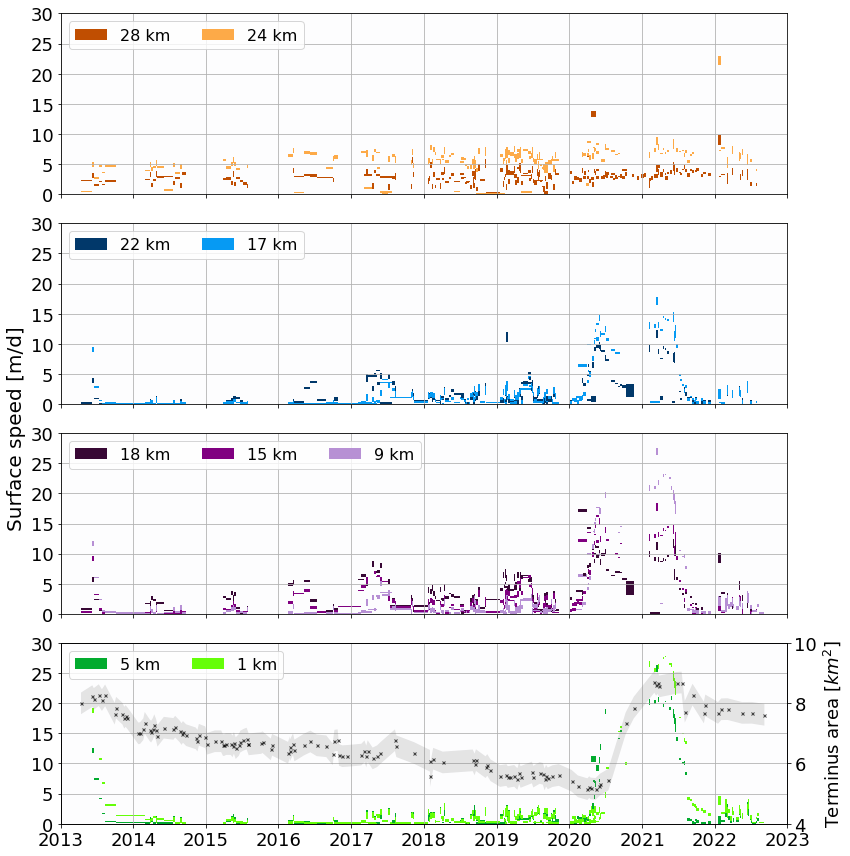

In [27]:
# Plot speeds
fs = 18 # common fontsize
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4,1,figsize=(12,12), sharex=True)
tpos_ax = ax4.twinx()
background_col='xkcd:pale grey'
ms = 1 # markersize for all points
a = 1 # alpha value for all patches

# PLOT TERMINUS POSITION
tpos_ax.fill_between(tpos_df.datetime,tpos_df.area_km2 - tpos_df.error_km2, 
                     tpos_df.area_km2 + tpos_df.error_km2, color='gray', edgecolor=None, alpha=0.2)
tpos_ax.plot(tpos_df.datetime, tpos_df.area_km2,'kx',markersize=3,alpha=0.7)

# for ds1, ds2 in unique_date_pairs:
for ds1, ds2 in list(zip(df.ds1,df.ds2)):
    datepair_df = df[(df.ds1 == ds1) & (df.ds2 == ds2)]
    
    # grab date
    date1 = datetime.datetime.strptime(str(ds1),'%Y-%m-%d %H:%M:%S')
    date2 = datetime.datetime.strptime(str(ds2),'%Y-%m-%d %H:%M:%S')
    dt_days = list(datepair_df.dt_days)[0] # grab the time separation
    mid_date =  date1+pd.Timedelta(days=dt_days/2)
    halfwidth = date2-mid_date # need halfwidth of dt for patch plotting
    
    # calculate mean error
    speed_err = np.nanmean(datepair_df.err_v) # RMSE

    # create the patch
    pw = halfwidth*2 # width 
    ph = speed_err*2 # height
    if ph < 0.25: # make minimum 0.25 height so we can see them
        ph = 0.25
    
#     if dt_days < 50:
    if dt_days >= 5:
         # plot patches and points by each region subplot
        # 1) above icefall - orange
        s24 = np.nanmean(datepair_df.s24); s28 = np.nanmean(datepair_df.s28)
        p24 = patches.Rectangle((date1, s24/365-speed_err),pw,ph,facecolor='#fdaa48', alpha=a) # light orange
        p28 = patches.Rectangle((date1, s28/365-speed_err),pw,ph,facecolor='#c04e01',alpha=a) # burnt orange
        ax1.add_patch(p28); ax1.add_patch(p24);  

        # 2) reservior zone (south) - blue
        s17 = np.nanmean(datepair_df.s17); s22 = np.nanmean(datepair_df.s22)
        p17 = patches.Rectangle((date1, s17/365-speed_err),pw,ph,facecolor='#069af3', alpha=a) # azure
        p22 = patches.Rectangle((date1, s22/365-speed_err),pw,ph,facecolor='#01386a', alpha=a) # marine blue
        ax2.add_patch(p22); ax2.add_patch(p17) 

        # 3) reservior zone (north) - purple
        s9 = np.nanmean(datepair_df.s9); s15 = np.nanmean(datepair_df.s15); s18 = np.nanmean(datepair_df.s18)
        p9 = patches.Rectangle((date1, s9/365-speed_err),pw,ph,facecolor='#b790d4', alpha=a) # pale purple
        p15 = patches.Rectangle((date1, s15/365-speed_err),pw,ph,facecolor='purple',alpha=a) # purple
        p18 = patches.Rectangle((date1, s18/365-speed_err),pw,ph,facecolor='#380835',alpha=a) # egg plant
        ax3.add_patch(p18); ax3.add_patch(p15); ax3.add_patch(p9); 

        # 4) recieving zone - green
        s1 = np.nanmean(datepair_df.s1); s5 = np.nanmean(datepair_df.s5)
        p1 = patches.Rectangle((date1, s1/365-speed_err),pw,ph,facecolor='#65fe08', alpha=a) # bright lime green
        p5 = patches.Rectangle((date1, s5/365-speed_err),pw,ph,facecolor='#02ab2e', alpha=a) # kelly green
        ax4.add_patch(p5); ax4.add_patch(p1); 

    
# TICKMARKS AND PLOT LIMITS
for ax in [ax1, ax2, ax3, ax4]:
    ax.set_yticks([0,5,10,15,20,25,30])
    ax.set_ylim(0,30)
    
ax1.tick_params(axis='both', labelsize=fs, labelbottom=False); ax1.grid()
# ax1.set_ylabel('Above icefall',fontsize=fs, color='orange') # plot as text instead
leg1 = ['28 km','24 km']
ax1.legend(leg1, loc='upper left', ncol=len(leg1), fontsize=fs-2)
# ax1.set_ylim(0,10)

ax2.tick_params(axis='both', labelsize=fs, labelbottom=False); ax3.grid()
# ax2.set_ylabel('Reservior zone\n(Southern tributary)',fontsize=fs,color='blue')
leg2 = ['22 km','17 km']
ax2.legend(leg2, loc='upper left', ncol=len(leg2), fontsize=fs-2)
 
# ax2.set_ylim(0,20)

ax3.tick_params(axis='both', labelsize=fs, labelbottom=False); ax2.grid()
# ax3.set_ylabel('Reservior zone',fontsize=fs,color='purple')
leg3 = ['18 km','15 km', '9 km']
ax3.legend(leg3, loc='upper left', ncol=len(leg3), fontsize=fs-2)
# ax3.set_ylim(0,25)

ax4.tick_params(axis='both', labelsize=fs); ax4.grid()
# ax4.set_ylabel('Receiving zone',fontsize=fs,color='green')
leg4 = ['5 km', '1 km']
ax4.legend(leg4, loc='upper left', ncol=len(leg4), fontsize=fs-2)
# ax4.set_ylim(0,30)

# terminus position secondary ax
tpos_ax.tick_params(axis='both', labelsize=fs, labelbottom=False)
tpos_ax.set_ylabel('Terminus area [$km^2$]', fontsize=fs, color='black')
tpos_ax.set_ylim(4,10)

# whole plot:
# x-axis
ax4.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
ax4.xaxis.set_minor_formatter(mdates.DateFormatter("%Y"))
ax4.set_xticks([datetime.datetime(2013,1,1),
           datetime.datetime(2014,1,1),
            datetime.datetime(2015,1,1),
            datetime.datetime(2016,1,1),
            datetime.datetime(2017,1,1),
            datetime.datetime(2018,1,1),
            datetime.datetime(2019,1,1),
            datetime.datetime(2020,1,1),
            datetime.datetime(2021,1,1),
            datetime.datetime(2022,1,1),
               datetime.datetime(2023,1,1)])
ax4.set_xlim(datetime.datetime(2013,1,1), datetime.datetime(2023,1,1))
# set background color
ax1.set_facecolor(background_col); ax2.set_facecolor(background_col);
ax3.set_facecolor(background_col); ax4.set_facecolor(background_col);

# labels and layout
fig.supylabel('Surface speed [m/d]', fontsize=fs+2)
plt.subplots_adjust(wspace=0.1, hspace=0)
fig.tight_layout() 
# plt.savefig('/Users/jukesliu/Documents/TURNER/DATA/figures/speed_timeseries_zone_pts_wS1_new.png',dpi=300)
plt.show()